<a href="https://colab.research.google.com/github/michalis0/DataMining_and_MachineLearning/blob/master/week4/EDA_and_Data_visualization.ipynb" 
target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Mining and Machine Learning 
# EDA and Data visualization

This notebooks introduces to Exploratory Data Analysis and visualization, mainly using the pandas library.

### Table of Contents
#### 1. Basic Example: Creating a DataFrame from Scratch
#### 2. Restaurant inspection results in NYC
* 2.1 Reading a CSV file
* 2.2 Descriptive statistics
* 2.3 Descriptive Statistics for Numeric Variables
* 2.4 Converting Dates
* 2.5 Categorical Variables
* 2.6 Analyzing the content of the columns
* 2.7 Selecting a subset of the columns
* 2.8 Selecting rows
* 2.9 Pivot Tables
* 2.10 (Optional, FYI) Advanced Pivot Tables
* 2.11 Exercises

#### 3. NYPD Vehicle Collisions
* 3.1 Introduction to the dataset
* 3.2 Plots, graphs and pivot tables
* 3.3 2d histograms, density plots, and contour plots
* 3.4 Combining plots
* 3.5 Bonus plots

## Setup and preliminaries

In [ ]:
# Render our plots inline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [ ]:
# Import requiered packages
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

We type some code to simply change the visual style of the plots. (The code below is optional and not necessary, and for now you do not need to understand what exactly is happening.)

In [ ]:
# Modifying the style of the graphs
matplotlib.style.use(['seaborn-talk', 'seaborn-ticks', 'seaborn-whitegrid'])

## 1. Basic Example: Creating a DataFrame from Scratch

This is an example of creating a dataframe by passing a list of dictionaries.

In [ ]:
df = pd.DataFrame([ 
    {"First Name": "Michalis", "Last Name":" Vlachos"},
    {"First Name": "John", "Last Name":" Doe"},
    {"Last Name":"Trump"}
])
df

,First Name,Last Name
0,Michalis,Vlachos
1,John,Doe
2,NaN,Trump


## 2. Restaurant inspection results in NYC

### 2.1 Reading a CSV file
We can directly load csv file from the url with pandas.

In [ ]:
url = 'https://data.cityofnewyork.us/api/views/43nn-pn8j/rows.csv?accessType=DOWNLOAD'
restaurants = pd.read_csv(url, 
                          encoding='utf_8', 
                          dtype = 'unicode',
                          parse_dates = True,
                          infer_datetime_format = True,
                          low_memory=False)

# Let's take a look at the first 5 rows of the dataframe
restaurants.head(5)

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA,Location Point
0,50119475,NaN,Queens,4518,QUEENS BLVD,11104,3479186666,NaN,01/01/1900,NaN,...,NaN,40.743218676743,-73.919372011645,402,26,018300,4001953,4001640001,QN31,NaN
1,50106755,Isabella,Manhattan,110,SAINT MARKS PLACE,10009,6466698044,NaN,01/01/1900,NaN,...,NaN,40.727320863195,-73.984684280858,103,02,003200,1005828,1004350019,MN22,NaN
2,50119262,NaN,Manhattan,15,8 AVENUE,10014,3477252414,NaN,01/01/1900,NaN,...,NaN,40.73772445083,-74.004636933759,102,03,007700,1011442,1006250042,MN23,NaN
3,50121192,NaN,Bronx,656,MORRIS PARK AVENUE,10462,7189319191,NaN,01/01/1900,NaN,...,NaN,40.844926676118,-73.867472708436,211,15,023600,2042992,2040310003,BX37,NaN
4,50113318,NaN,Brooklyn,390,5 AVENUE,11215,3476864156,NaN,01/01/1900,NaN,...,NaN,40.670789582136,-73.984964072896,306,39,013700,3021601,3009930036,BK37,NaN


Alternatively, we can first download it and then load it from a local directory in our computer (in case we are not using colab). The `pd.read_csv` method has many options, and you can further read in the [online documentation](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.read_csv.html).

### 2.2 Descriptive statistics

We can use the method `describe()` to get a quick overview of the data in the DataFrame.

In [ ]:
restaurants.describe()

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA,Location Point
count,240561,238971,240561,240079,240534,237200,240539,236384,240561,236384,...,236384,240286,240286,236535,236535,236535,235319,239869,236535,0
unique,28014,21281,6,7559,2424,230,25495,87,1641,5,...,30,22865,22865,69,51,1178,19806,19504,193,0
top,41187577,DUNKIN,Manhattan,1,BROADWAY,10003,7185958100,American,01/01/1900,Violations were cited in the following area(s).,...,Cycle Inspection / Initial Inspection,0,0,105,03,006500,4000000,1,MN17,NaN
freq,87,2858,90719,1280,8694,5721,297,44240,4177,223134,...,142039,3334,3334,17568,20617,2006,1252,2029,12978,NaN


We can also check the data types for each column using `dtypes`.

In [ ]:
restaurants.dtypes
# also try: restaurants.info()

CAMIS                    object
DBA                      object
BORO                     object
BUILDING                 object
STREET                   object
ZIPCODE                  object
PHONE                    object
CUISINE DESCRIPTION      object
INSPECTION DATE          object
ACTION                   object
VIOLATION CODE           object
VIOLATION DESCRIPTION    object
CRITICAL FLAG            object
SCORE                    object
GRADE                    object
GRADE DATE               object
RECORD DATE              object
INSPECTION TYPE          object
Latitude                 object
Longitude                object
Community Board          object
Council District         object
Census Tract             object
BIN                      object
BBL                      object
NTA                      object
Location Point           object
dtype: object

The `object` type is a string. For some of them, we would like to change the data types using the `pd.to_numeric` and `pd.to_datetime` functions. We examine how to convert data types in the next subsection.

### 2.3 Descriptive Statistics for Numeric Variables


#### 2.3.1 Converting Data Types to Numeric

The `object` type is a string. When we want to convert an object to numeric, we can use the `pd.to_numeric` function, as shown below:

In [ ]:
restaurants[["SCORE"]].head()

,SCORE
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN


In [ ]:
# convert score to numeric
restaurants["SCORE"] = pd.to_numeric(restaurants["SCORE"])
restaurants.dtypes

CAMIS                     object
DBA                       object
BORO                      object
BUILDING                  object
STREET                    object
ZIPCODE                   object
PHONE                     object
CUISINE DESCRIPTION       object
INSPECTION DATE           object
ACTION                    object
VIOLATION CODE            object
VIOLATION DESCRIPTION     object
CRITICAL FLAG             object
SCORE                    float64
GRADE                     object
GRADE DATE                object
RECORD DATE               object
INSPECTION TYPE           object
Latitude                  object
Longitude                 object
Community Board           object
Council District          object
Census Tract              object
BIN                       object
BBL                       object
NTA                       object
Location Point            object
dtype: object

#### 2.3.2 Basic descriptive statistics for numeric variables

And now that SCORE is a numeric variable, we can get more detailed descriptive statistics for the variable using the `.describe()` command:

In [ ]:
# For column names without a space, we can also access directly the column as follows:
restaurants.SCORE.describe()

count    228899.000000
mean         21.783337
std          16.524945
min           0.000000
25%          11.000000
50%          17.000000
75%          28.000000
max         172.000000
Name: SCORE, dtype: float64

#### 2.3.3 A first histogram
And now that SCORE is a numeric variable, we can examine its distribution by using the `hist` command of Pandas, which creates a histogram. (The histogram is also available as `plot.hist()`, or `plot(kind='hist')`).

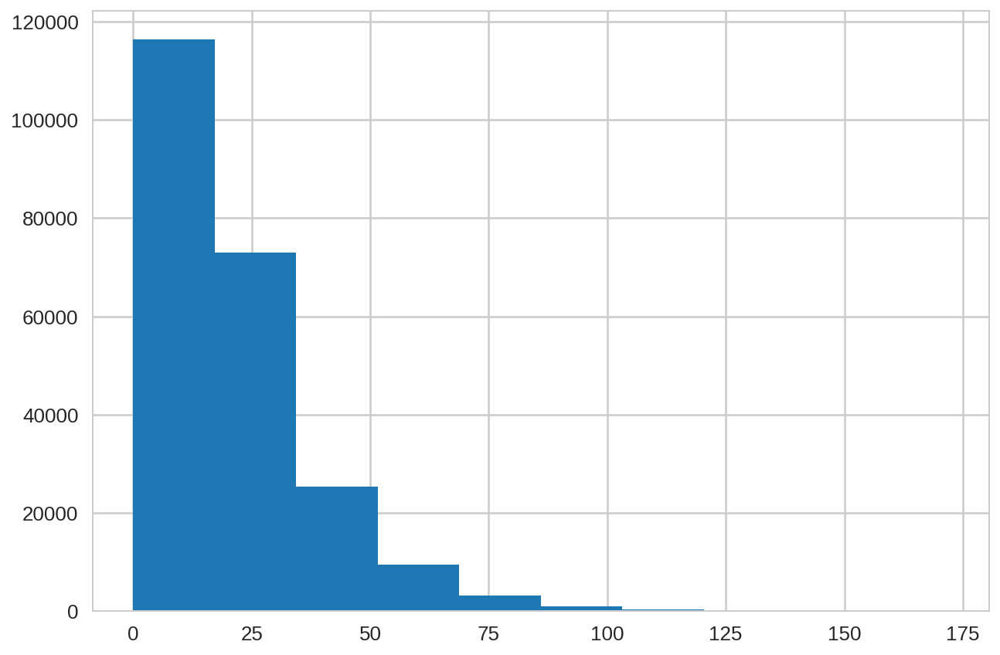

In [ ]:
restaurants["SCORE"].hist()
# restaurants["SCORE"].plot(kind='hist')

By default, the histogram has ~10 bars. We can change the resolution of the histogram using the `bins` attribute. Larger numbers of `bins` allow for higher resolution, but if we increase the number too much, many bins end up having very few, or no data points. For example, experiment with changing the number of bins below, and change the value from 50 to something greater.

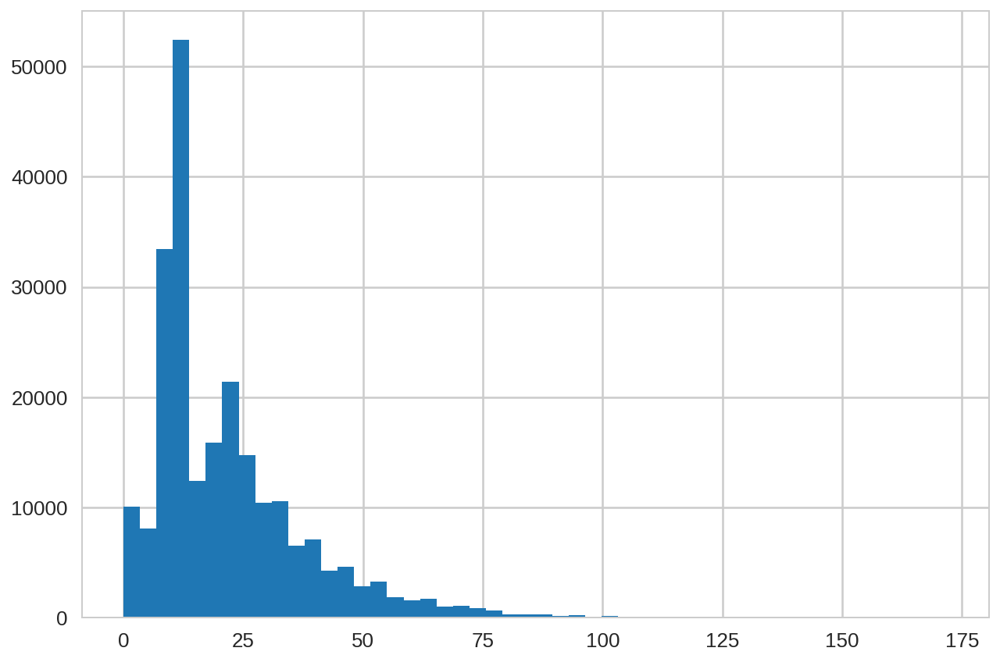

In [ ]:
restaurants["SCORE"].hist(bins=50) # try with e.g. bins=200

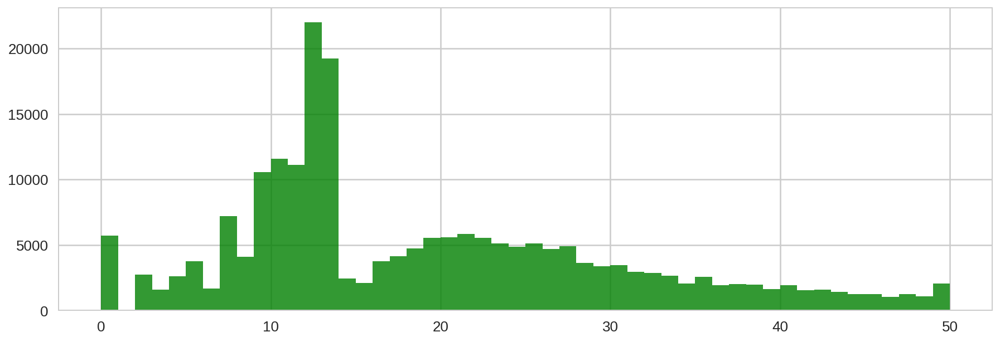

In [ ]:
# A quick exposure to various options of the "hist" command
restaurants.SCORE.hist(bins=50, # use 50 bars
                          range=(0,50), # x-axis from 0 to 50
                          density=False,  # show normalized count (density=True), or raw counts (density= False)
                          figsize=(15,5), # controls the size of the plot
                          alpha=0.8, # make the plot 20% transparent
                          color='green' # change color
                         )

#### 2.3.4 Kernel Density Estimation (KDE)

An alternative to histograms is to use the **kernel density**, which estimates a continuous function, instead of the bucketized counts, which tends to be discontinuous and bumpy. We can access this usind the `.plot(kind='kde')` command:

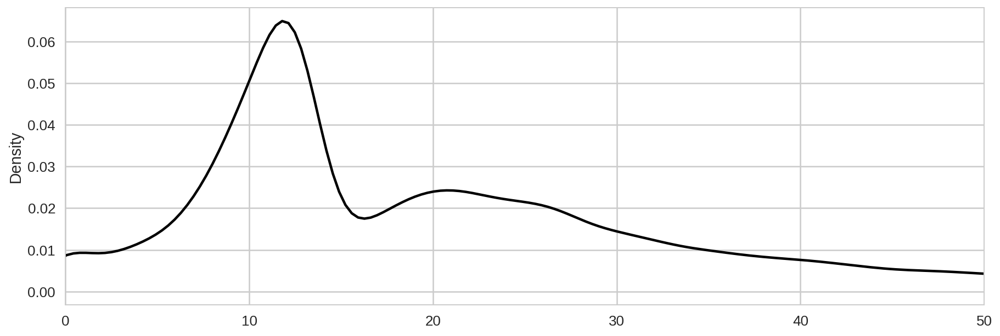

In [ ]:
# This plots the density of a numeric attribute
# kde = kernel density estimation
restaurants.SCORE.plot(
    kind='kde', 
    color='Black', 
    xlim=(0,50), 
    figsize=(15,5)
)

### 2.4 Converting Dates

Now let's convert the dates columns into the appropriate data types. Let's take a look at a few dates.

In [ ]:
restaurants["GRADE DATE"].sample(10) # 10 random dates

145973           NaN
31907            NaN
66517            NaN
232089    11/08/2017
43029            NaN
219661    08/04/2021
189238    10/15/2019
17243            NaN
225572    08/01/2022
173464           NaN
Name: GRADE DATE, dtype: object

To this end, we first need to understand how to [parse dates using the Python conventions](https://docs.python.org/3/library/datetime.html#strftime-and-strptime-behavior).

The relevant entries from the table are:
* `%m` Month as a zero-padded decimal number.
* `%d` 	Day of the month as a zero-padded decimal number.
* `%Y` Year with century as a decimal number.

Now, we can specify how to parse the dates. (In principle, we can let Pandas do this automatically, but it is _much_ faster if we specify it ourselves. It is also much less error-prone).

In [ ]:
restaurants["GRADE DATE"] = pd.to_datetime(restaurants["GRADE DATE"], format="%m/%d/%Y")
restaurants["RECORD DATE"] = pd.to_datetime(restaurants["RECORD DATE"], format="%m/%d/%Y")
restaurants["INSPECTION DATE"] = pd.to_datetime(restaurants["INSPECTION DATE"], format="%m/%d/%Y")

In [ ]:
restaurants.dtypes

CAMIS                            object
DBA                              object
BORO                             object
BUILDING                         object
STREET                           object
ZIPCODE                          object
PHONE                            object
CUISINE DESCRIPTION              object
INSPECTION DATE          datetime64[ns]
ACTION                           object
VIOLATION CODE                   object
VIOLATION DESCRIPTION            object
CRITICAL FLAG                    object
SCORE                           float64
GRADE                            object
GRADE DATE               datetime64[ns]
RECORD DATE              datetime64[ns]
INSPECTION TYPE                  object
Latitude                         object
Longitude                        object
Community Board                  object
Council District                 object
Census Tract                     object
BIN                              object
BBL                              object


In [ ]:
restaurants[["INSPECTION DATE", "GRADE DATE", "RECORD DATE"]].describe()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  """Entry point for launching an IPython kernel.


,INSPECTION DATE,GRADE DATE,RECORD DATE
count,240561,111519,240561
unique,1641,1467,1
top,1900-01-01 00:00:00,2022-03-03 00:00:00,2022-10-05 00:00:00
freq,4177,405,240561
first,1900-01-01 00:00:00,2013-07-30 00:00:00,2022-10-05 00:00:00
last,2022-10-04 00:00:00,2022-10-04 00:00:00,2022-10-05 00:00:00


#### Dates: exercise

* Plot a histogram for `INSPECTION DATE`, `GRADE DATE`, `RECORD DATE`. What do you see?
* Try modifying the `bins` parameter. What are the results?
* The `range=(start, finish)` command is often useful, when we want to focus on a particular part of the dataset. Try using that for  `INSPECTION DATE` to limit the dates to be between 1/1/2014 and 05/31/2018.

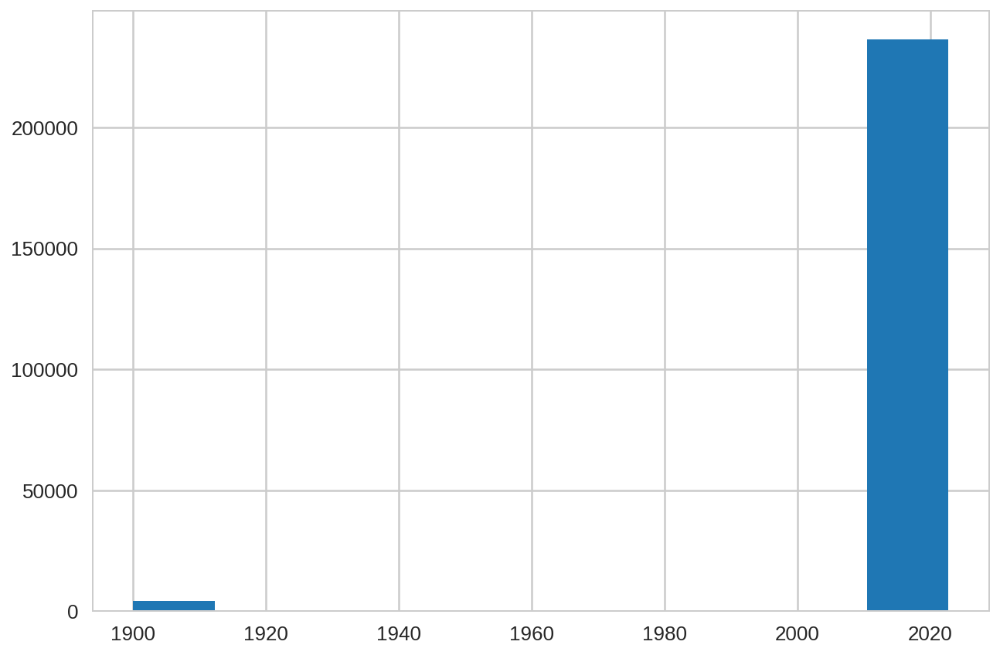

In [ ]:
# Not very appealing
restaurants['INSPECTION DATE'].hist()

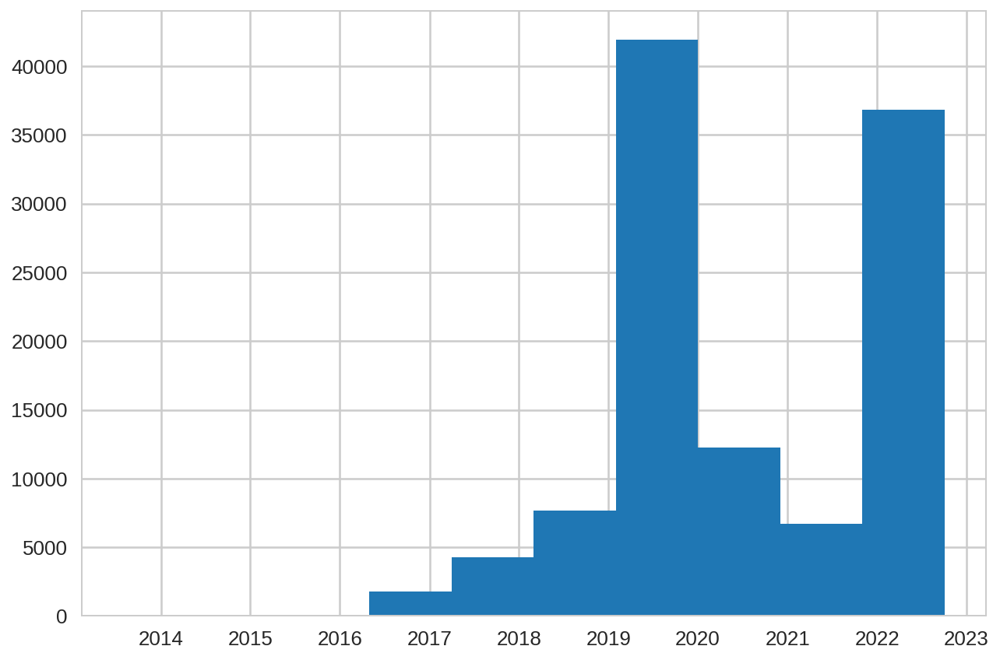

In [ ]:
restaurants['GRADE DATE'].hist()

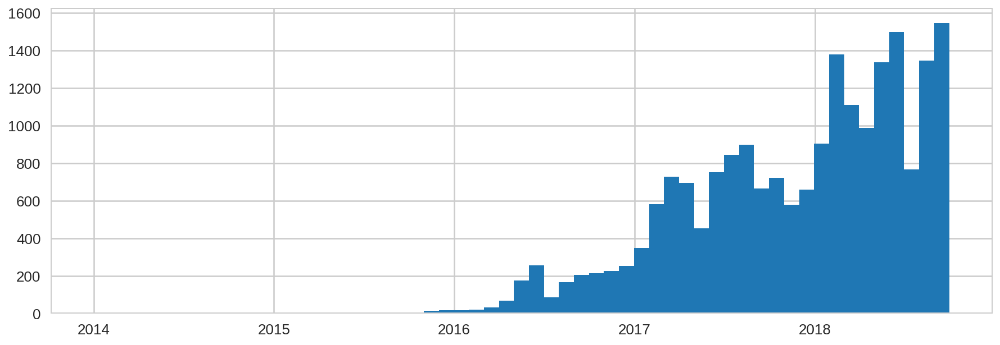

In [ ]:
restaurants['INSPECTION DATE'].hist(
    range = (pd.to_datetime('1-1-2014'),pd.to_datetime('9-30-2018')), # limit the range of dates, ignore the 1/1/1990 faulty valye
    bins = 57, # number of months in the range -- computed manually
    figsize = (15,5) # resize 15-width, 5-height
)

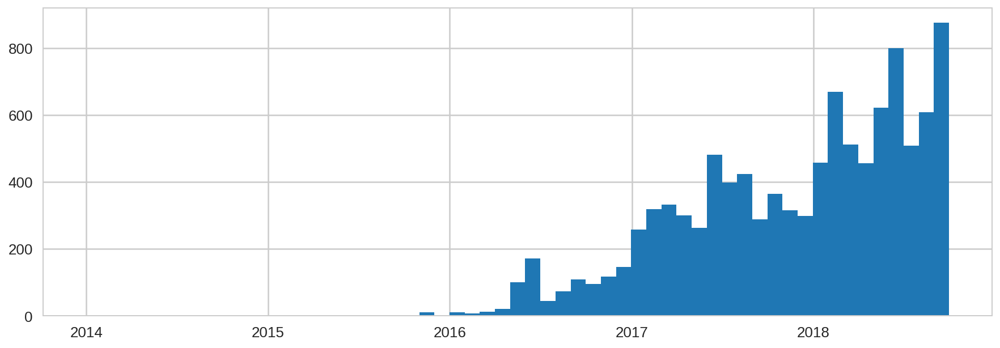

In [ ]:
restaurants['GRADE DATE'].hist(
    range = (pd.to_datetime('1-1-2014'),pd.to_datetime('9-30-2018')), # limit the range of dates, ignore the 1/1/1990 faulty valye
    bins = 57, # number of months in the range -- computed manually
    figsize = (15,5) # resize 15-width, 5-height
)

### 2.5 Categorical Variables

This is less important, but sometimes we want to specify variables to be "Categorical". This is most commonly useful when we have variables that have an implicit order (e.g., the A/B/C grade of the restaurant).

In [ ]:
restaurants["BORO"] =  pd.Categorical(restaurants["BORO"], ordered=False)
restaurants["GRADE"] =  pd.Categorical(restaurants["GRADE"], categories = ['A', 'B', 'C'], ordered=True)
restaurants["VIOLATION CODE"] =  pd.Categorical(restaurants["VIOLATION CODE"], ordered=False)
restaurants["CRITICAL FLAG"] =  pd.Categorical(restaurants["CRITICAL FLAG"], ordered=False)
restaurants["ACTION"] =  pd.Categorical(restaurants["ACTION"], ordered=False)
restaurants["CUISINE DESCRIPTION"] =  pd.Categorical(restaurants["CUISINE DESCRIPTION"], ordered=False)
restaurants.dtypes

CAMIS                            object
DBA                              object
BORO                           category
BUILDING                         object
STREET                           object
ZIPCODE                          object
PHONE                            object
CUISINE DESCRIPTION            category
INSPECTION DATE          datetime64[ns]
ACTION                         category
VIOLATION CODE                 category
VIOLATION DESCRIPTION            object
CRITICAL FLAG                  category
SCORE                           float64
GRADE                          category
GRADE DATE               datetime64[ns]
RECORD DATE              datetime64[ns]
INSPECTION TYPE                  object
Latitude                         object
Longitude                        object
Community Board                  object
Council District                 object
Census Tract                     object
BIN                              object
BBL                              object


### 2.6 Analyzing the content of the columns

We can also get quick statistics about the common values that appear in each column:

In [ ]:
restaurants["DBA"].value_counts()[:10]

DUNKIN                                   2858
SUBWAY                                   1711
STARBUCKS                                1224
MCDONALD'S                               1129
KENNEDY FRIED CHICKEN                     787
CROWN FRIED CHICKEN                       724
BURGER KING                               664
POPEYES                                   645
GOLDEN KRUST CARIBBEAN BAKERY & GRILL     573
DOMINO'S                                  543
Name: DBA, dtype: int64

In [ ]:
restaurants["CUISINE DESCRIPTION"].value_counts()[:5]

American          44240
Chinese           23002
Pizza             14692
Coffee/Tea        12500
Latin American    10269
Name: CUISINE DESCRIPTION, dtype: int64

And we can use the "plot" command to plot the resulting histogram (more detail at https://pandas.pydata.org/pandas-docs/stable/user_guide/visualization.html).

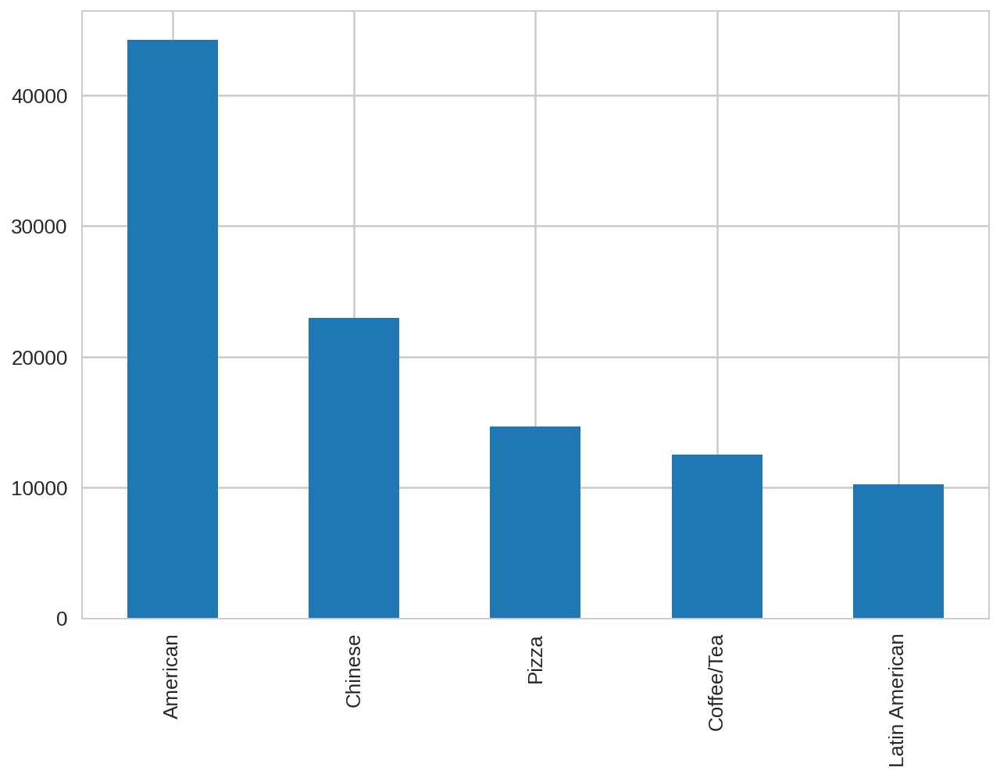

In [ ]:
restaurants["CUISINE DESCRIPTION"].value_counts()[:5].plot(kind='bar')

In [ ]:
popular = restaurants["CUISINE DESCRIPTION"].value_counts()
popular

American          44240
Chinese           23002
Pizza             14692
Coffee/Tea        12500
Latin American    10269
                  ...  
Czech                18
Lebanese             10
Basque                7
New French            6
Armenian              4
Name: CUISINE DESCRIPTION, Length: 87, dtype: int64

Hm, that does not look nice. Let's shorten the name of the cuisine for the _"Latin (Cuban, Dominican, Puerto Rican, South & Central American)"_ and replace it with _"Latin American"_. We will use the `replace` command in Pandas:

In [ ]:
restaurants["CUISINE DESCRIPTION"].replace(
    to_replace='Latin (Cuban, Dominican, Puerto Rican, South & Central American)',
    value = 'Latin American',
    inplace=True
)

In [ ]:
restaurants["CUISINE DESCRIPTION"].replace(
    to_replace='CafÃ©/Coffee/Tea',
    value = 'Cafe/Coffee/Tea',
    inplace=True
)

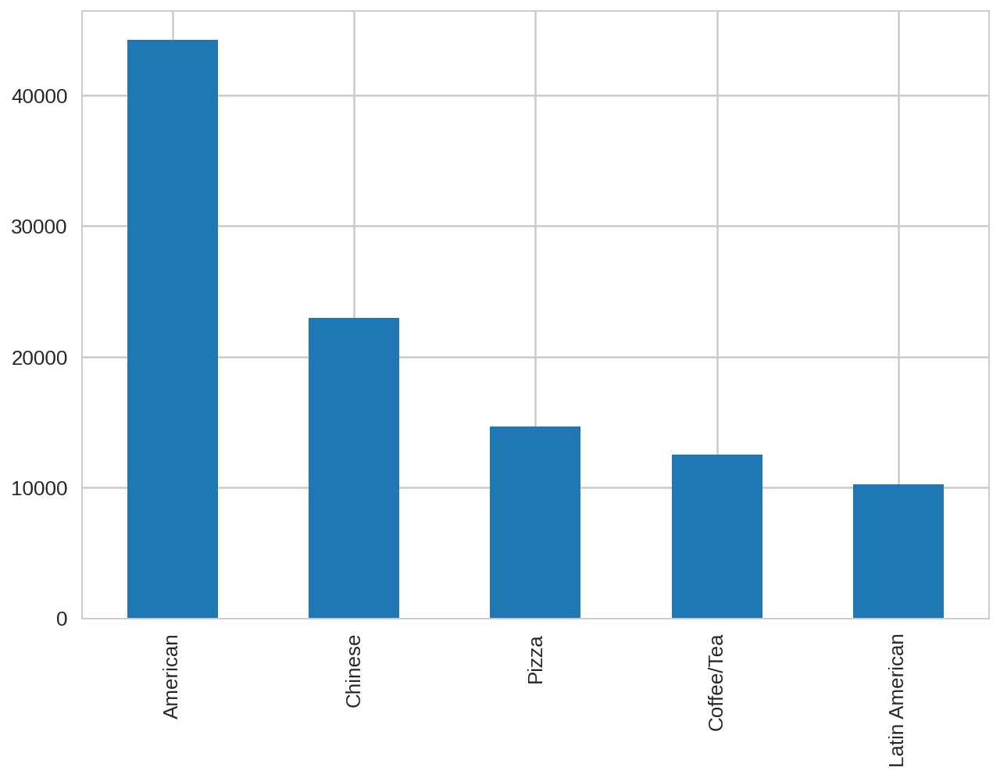

In [ ]:
popular = restaurants["CUISINE DESCRIPTION"].value_counts()
popular[:5].plot(kind='bar')

Let's do the similar histogram for the violation codes.

In [ ]:
restaurants["VIOLATION CODE"].head(5)

0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
Name: VIOLATION CODE, dtype: category
Categories (136, object): ['02A', '02B', '02C', '02D', ..., '28-04', '28-05', '28-06', '28-07']

In [ ]:
violation_counts = restaurants["VIOLATION CODE"].value_counts();
violation_counts[0:10]

10F    41112
08A    25363
04L    15850
06D    15699
02G    14418
06C    14199
10B    13453
04N    11574
02B    10720
04H     5402
Name: VIOLATION CODE, dtype: int64

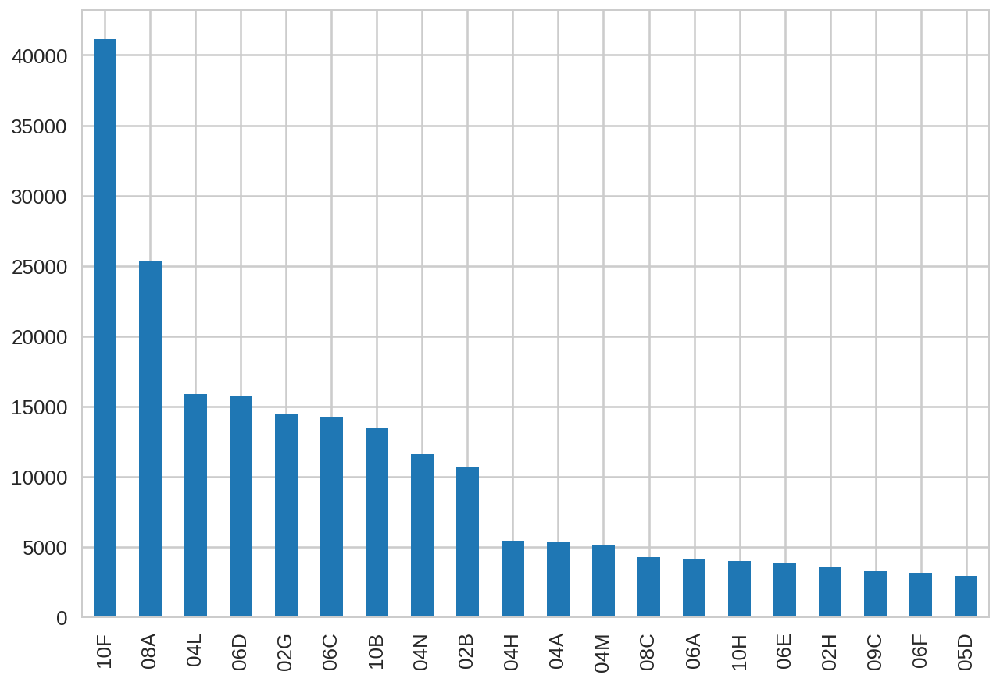

In [ ]:
violation_counts[0:20].plot(kind='bar')

#### Plot: Exercise

* Create a plot showing the number of inspections that happen across **boroughs**. Use the `BORO` column and the `value_counts()` function.

In [ ]:
restaurants['BORO'].value_counts()

Manhattan        90719
Brooklyn         62279
Queens           57063
Bronx            22409
Staten Island     8015
0                   76
Name: BORO, dtype: int64

In [ ]:
# Same as above; works only for attribute names without spaces
restaurants.BORO.value_counts()

Manhattan        90719
Brooklyn         62279
Queens           57063
Bronx            22409
Staten Island     8015
0                   76
Name: BORO, dtype: int64

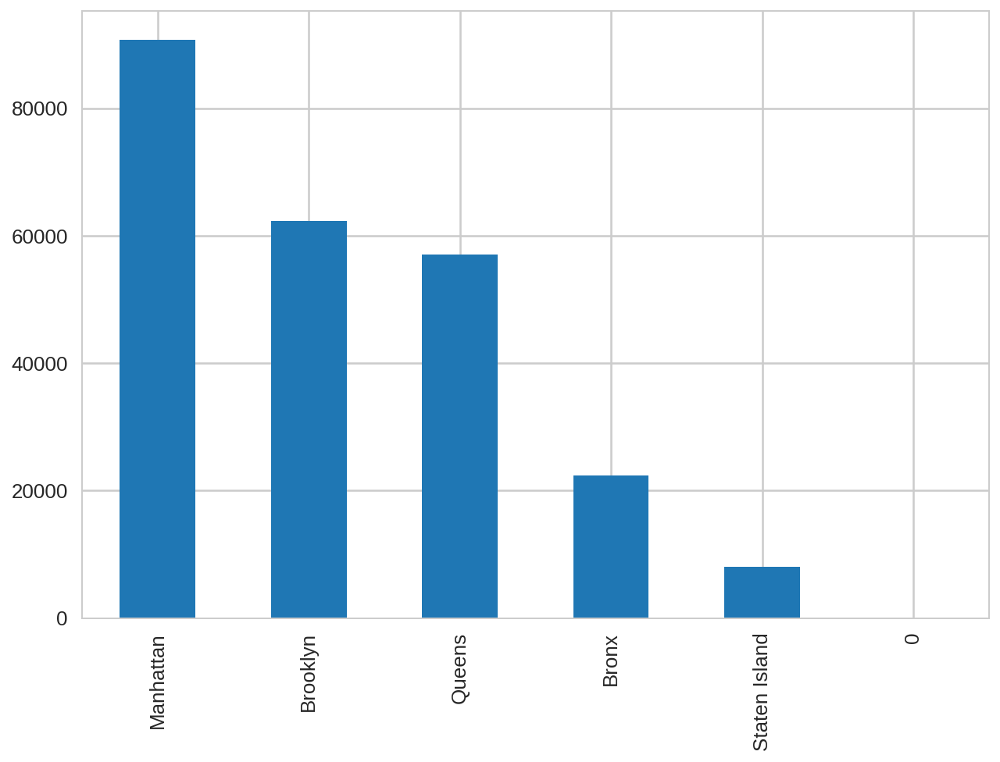

In [ ]:
restaurants['BORO'].value_counts().plot(kind='bar')

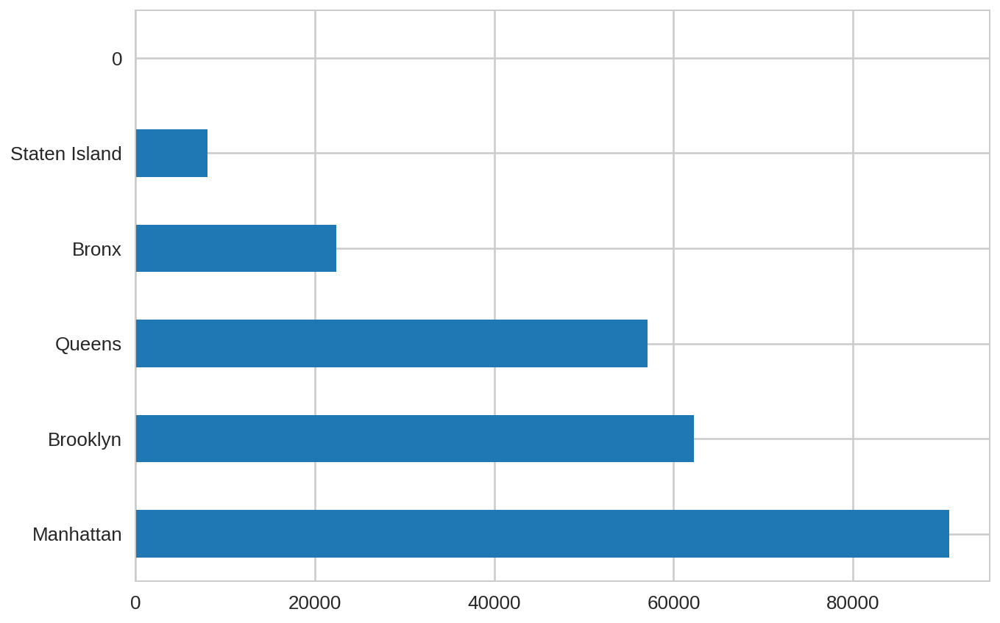

In [ ]:
restaurants['BORO'].value_counts().plot(kind='barh')

### 2.7 Selecting a subset of the columns

In a dataframe, we can specify the column(s) that we want to keep, and get back another dataframe with just the subset of the columns that we want to keep.

In [ ]:
restaurants[ ["DBA", "GRADE", "GRADE DATE"] ].head()

,DBA,GRADE,GRADE DATE
0,NaN,NaN,NaT
1,Isabella,NaN,NaT
2,NaN,NaN,NaT
3,NaN,NaN,NaT
4,NaN,NaN,NaT


In [ ]:
columns = ["GRADE DATE", "VIOLATION CODE", "DBA", "SCORE"]
restaurants[ columns ].head()

,GRADE DATE,VIOLATION CODE,DBA,SCORE
0,NaT,NaN,NaN,NaN
1,NaT,NaN,Isabella,NaN
2,NaT,NaN,NaN,NaN
3,NaT,NaN,NaN,NaN
4,NaT,NaN,NaN,NaN


### 2.8 Selecting rows

To select rows, we can use the following approach, where we generate a list of boolean values, one for each row of the dataframe, and then we use the list to select which of the rows of the dataframe we want to keep.

In [ ]:
# Create the condition "has mice" for code 04L
mice = (restaurants["VIOLATION CODE"] == "04L")
mice.head()

0    False
1    False
2    False
3    False
4    False
Name: VIOLATION CODE, dtype: bool

In [ ]:
# Apply the condition to the dataframe "restaurants" and store the result 
# in a dataframe called has_mice
has_mice = restaurants[mice]
has_mice.head()

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA,Location Point
136,50101336,SUSHIVA,Manhattan,615,9 AVENUE,10036,2122658688,Japanese,2022-08-30,Violations were cited in the following area(s).,...,Cycle Inspection / Re-inspection,40.759468255616,-73.99188180429,104,03,012100,1026366,1010530033,MN15,NaN
368,40513021,BLUE MOUNTAIN RESTAURANT & JERK CENTER,Brooklyn,169597,UTICA AVENUE,NaN,7183382968,Caribbean,2019-03-06,Violations were cited in the following area(s).,...,Cycle Inspection / Initial Inspection,0,0,NaN,NaN,NaN,NaN,3,NaN,NaN
395,50063834,AVIATOR GRILL AT INTREPID,Manhattan,1,INTREPID SQ,NaN,3472208442,American,2022-06-09,Violations were cited in the following area(s).,...,Cycle Inspection / Initial Inspection,0,0,NaN,NaN,NaN,NaN,1,NaN,NaN
416,41607908,LONGEVOUSJOY,Brooklyn,6610,BAY PARKWAY,11204,3473742645,Japanese,2022-04-27,Violations were cited in the following area(s).,...,Cycle Inspection / Re-inspection,40.612945692503,-73.982387502381,311,47,025600,3134526,3055640044,BK28,NaN
574,50069543,TOP THAI,Manhattan,235,SULLIVAN STREET,10012,6467264418,Thai,2018-05-21,Violations were cited in the following area(s).,...,Cycle Inspection / Initial Inspection,40.729704341833,-73.999646408867,102,01,006500,1008670,1005390013,MN23,NaN


In [ ]:
# List the most frequent DBA values in the data of restaurants that have mice
has_mice["DBA"].value_counts()[:20]

SUBWAY                                   121
DUNKIN                                    96
CROWN FRIED CHICKEN                       65
KENNEDY FRIED CHICKEN                     57
BURGER KING                               44
GOLDEN KRUST CARIBBEAN BAKERY & GRILL     42
POPEYES                                   37
MCDONALD'S                                35
STARBUCKS                                 35
DOMINO'S                                  30
AMC THEATRES                              27
CARVEL                                    27
PAPA JOHN'S                               25
DUNKIN',' BASKIN ROBBINS                  20
LITTLE CAESARS                            19
IHOP                                      19
JOE & THE JUICE                           15
INSOMNIA COOKIES                          15
LA PULPERIA                               13
VIVI BUBBLE TEA                           12
Name: DBA, dtype: int64

In [ ]:
has_mice["CAMIS"].value_counts()[:5]

40399329    9
50013837    9
40635294    8
40610000    8
50015096    8
Name: CAMIS, dtype: int64

In [ ]:
condition = (has_mice["CAMIS"] == '41259444')
has_mice[condition].head()

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA,Location Point


And we can use more complex conditions. 

In [ ]:
mice_Brooklyn =  ( (restaurants["VIOLATION CODE"] == "04L") 
                    & (restaurants["BORO"] == "Brooklyn") )

In [ ]:
has_mice_brooklyn = restaurants[mice_Brooklyn]
has_mice_brooklyn.head()

,CAMIS,DBA,BORO,BUILDING,STREET,ZIPCODE,PHONE,CUISINE DESCRIPTION,INSPECTION DATE,ACTION,...,INSPECTION TYPE,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA,Location Point
368,40513021,BLUE MOUNTAIN RESTAURANT & JERK CENTER,Brooklyn,169597,UTICA AVENUE,NaN,7183382968,Caribbean,2019-03-06,Violations were cited in the following area(s).,...,Cycle Inspection / Initial Inspection,0,0,NaN,NaN,NaN,NaN,3,NaN,NaN
416,41607908,LONGEVOUSJOY,Brooklyn,6610,BAY PARKWAY,11204,3473742645,Japanese,2022-04-27,Violations were cited in the following area(s).,...,Cycle Inspection / Re-inspection,40.612945692503,-73.982387502381,311,47,025600,3134526,3055640044,BK28,NaN
832,41397502,LA BAGEL DELIGHT,Brooklyn,284,7 AVENUE,11215,7187686107,Bagels/Pretzels,2022-05-06,Violations were cited in the following area(s).,...,Cycle Inspection / Re-inspection,40.668376224864,-73.980350548562,306,39,015300,3397463,3009950043,BK37,NaN
1601,50123254,NICE CHINATOWN,Brooklyn,1411,FOSTER AVENUE,11230,9173752552,Chinese,2022-06-17,Establishment Closed by DOHMH. Violations were...,...,Pre-permit (Operational) / Initial Inspection,40.633733053227,-73.963762393114,314,40,052000,3121165,3052350033,BK42,NaN
1763,50122129,D-GARDEN CARIBBEAN BAR & GRILL,Brooklyn,4617,AVENUE D,11203,9293498757,Caribbean,2022-08-01,Violations were cited in the following area(s).,...,Pre-permit (Non-operational) / Initial Inspection,40.641909609185,-73.932978480118,317,45,084000,3112291,3049630042,BK91,NaN


In [ ]:
has_mice_brooklyn["DBA"].value_counts()[:20]

CROWN FRIED CHICKEN                      36
KENNEDY FRIED CHICKEN                    17
GOLDEN KRUST CARIBBEAN BAKERY & GRILL    17
PAPA JOHN'S                              16
DUNKIN                                   15
BURGER KING                              14
HOP LEE KITCHEN                           8
SUBWAY                                    8
773 LOUNGE                                7
TAQUERIA RESTAURANTE MI BARRIO            7
TASTE OF CHINA                            7
LUZZO'S BK                                7
BUKA                                      7
STEWARTS                                  7
CHANCE 11                                 7
LOOKING GLASS                             6
DOUBLE DRAGON                             6
BAOBURG                                   6
UNION PIZZA WORKS                         6
KABIR'S BAKERY                            6
Name: DBA, dtype: int64

### 2.9 Pivot Tables

[Pivot tables](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.pivot_table.html) is one of the most commonly used exploratory tools, and in Pandas they are extremely flexible. 

For example, let's try to count the number of restaurants that are inspected every day. 

In [ ]:
pivot = pd.pivot_table(
    data = restaurants, 
    index = 'INSPECTION DATE', # specifies the rows
    values = 'CAMIS',  # specifies the content of the cells
    aggfunc = 'count' # we ask to count how many different CAMIS values we see
)

In [ ]:
pivot.head(20)

,CAMIS
INSPECTION DATE,
1900-01-01,4177
2013-07-30,1
2014-09-23,3
2014-10-14,2
2015-04-21,1
2015-06-25,2
2015-07-08,3
2015-09-24,5
2015-10-14,2


Now, let's plot this. By default, Pandas considers the "index" column to be the x-axis, and plots the rest.

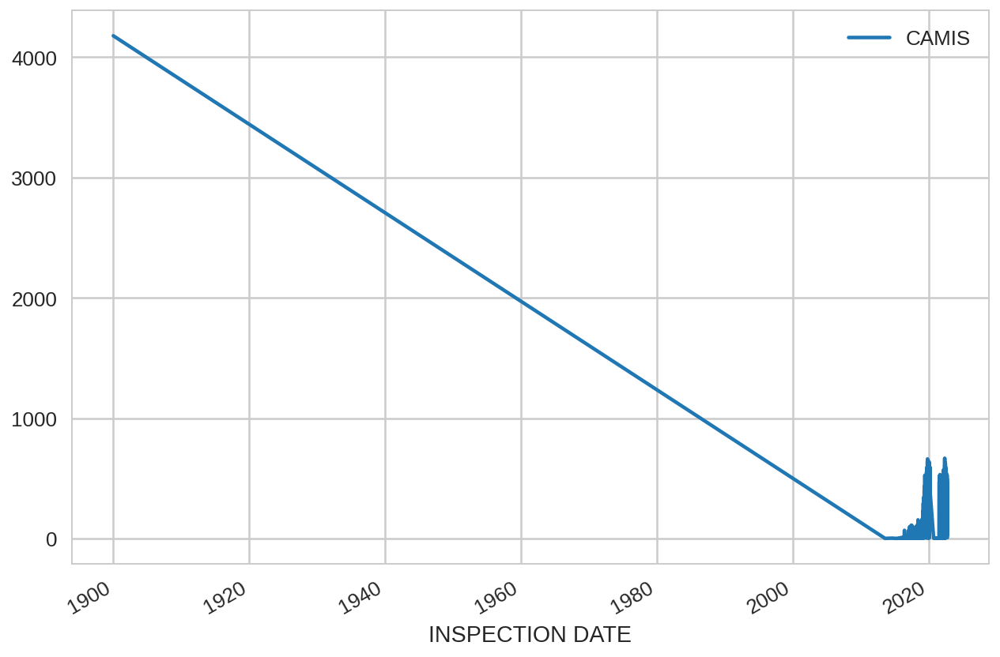

In [ ]:
pivot.plot()

#### 2.9.1 Deleting rows from a table

Hm, that '1900-01-01' line is messing things up. Let's delete it, using the `drop` command. Notice a few things:
* We use the `pd.to_datetime` command to convert the '1900-01-01' string into a datetime data type.
* We use the `axis='index'` parameter means that we delete a **row** with that index value. (The `axis='columns'` means that we delete a column.). Often you will see `axis=0` (equivalent to `axis='index'`) and `axis=1` (equivalent to `axis='columns'`).
* The `inplace=True` means that we change directly the dataframe, instead of returning a new dataframe that does not have the deleted value.

In [ ]:
pivot.drop(pd.to_datetime('1900-01-01'), axis='index', inplace=True)

In [ ]:
pivot.head(5)

,CAMIS
INSPECTION DATE,
2013-07-30,1
2014-09-23,3
2014-10-14,2
2015-04-21,1
2015-06-25,2


And let's plot again.

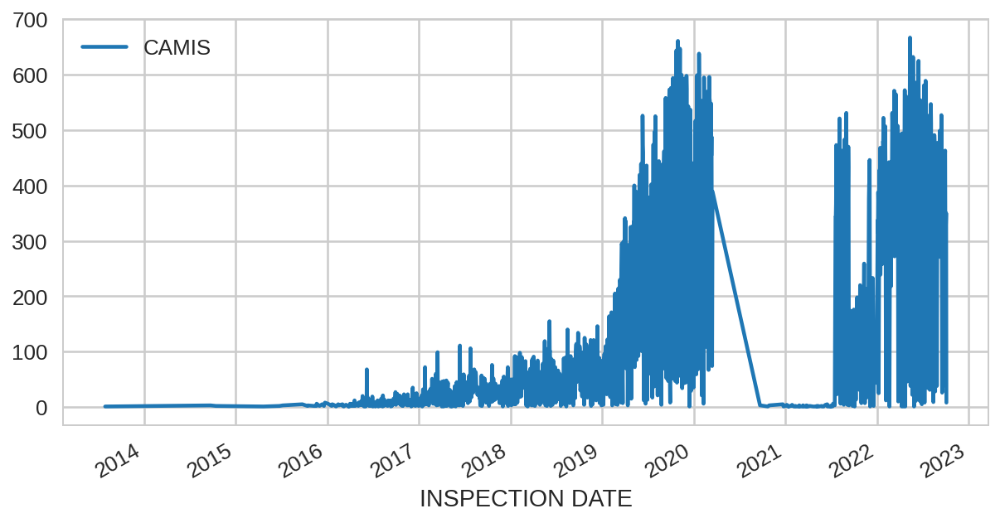

In [ ]:
pivot.plot(figsize=(10,5))

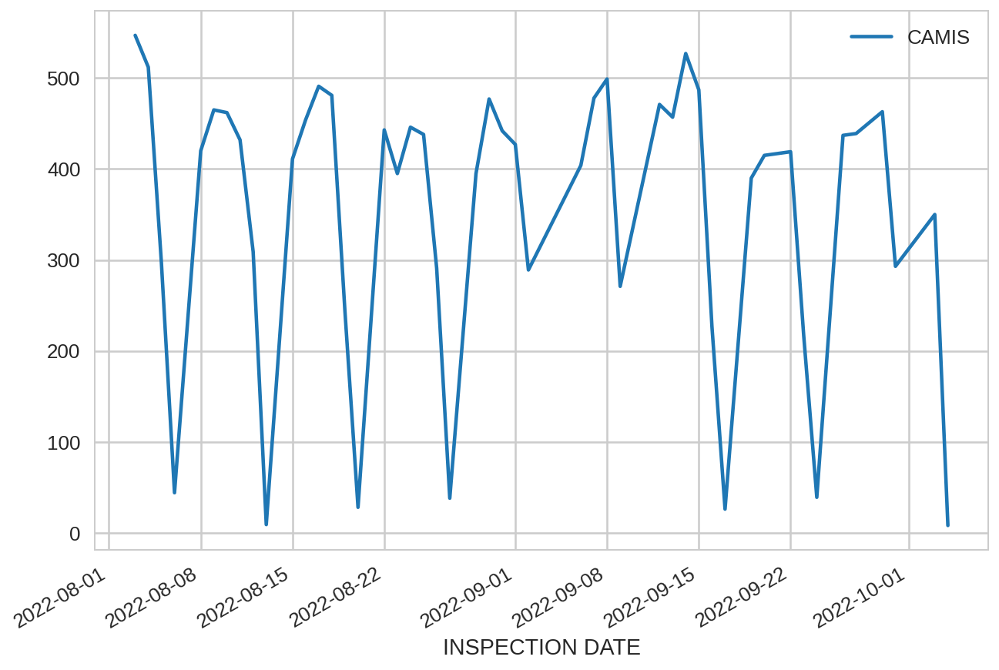

In [ ]:
pivot.tail(50).plot()

#### 2.9.2 Changing date granularity 

We can also use the [resample](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.resample.html) command to change the frequency from one day, to, say, 7 days. Then we can compute, say, the average (`mean()`) for these days, or the total number (`sum()`) of inspections.

In [ ]:
pivot.resample('1W').mean().tail(10)

,CAMIS
INSPECTION DATE,
2022-08-07,392.500000
2022-08-14,349.500000
2022-08-21,351.500000
2022-08-28,341.833333
2022-09-04,406.000000
2022-09-11,413.000000
2022-09-18,365.833333
2022-09-25,316.166667
2022-10-02,416.600000


Now, let's plot this. By default, Pandas considers the "index" column to be the x-axis, and plots the rest.

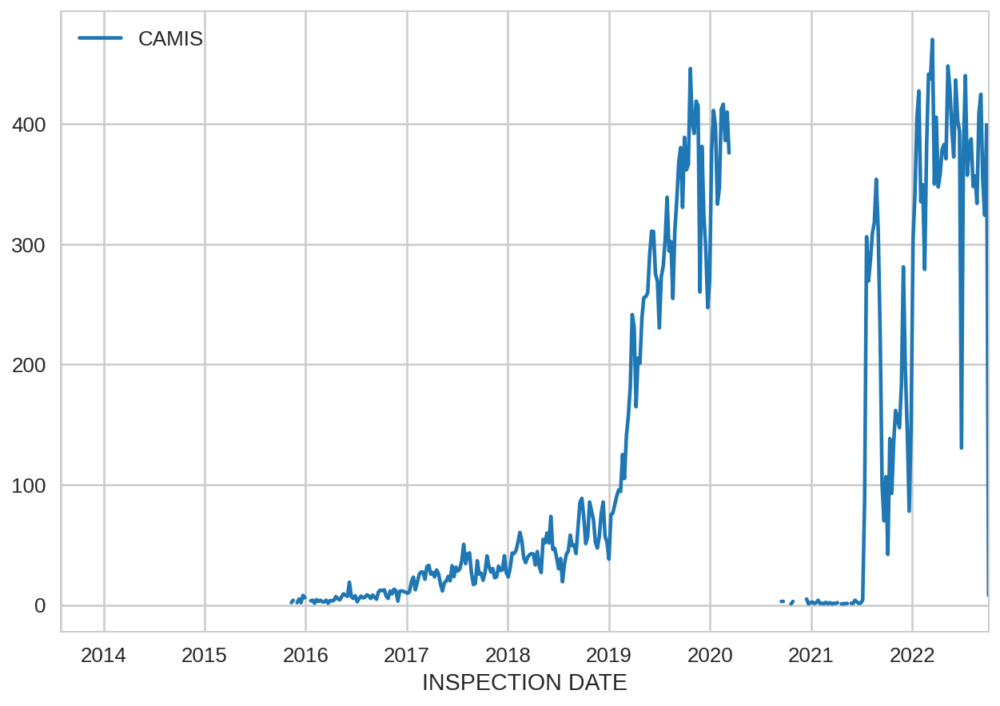

In [ ]:
# Plot the average number of inspections, over 7-day periods
pivot.resample('7D').mean().plot()

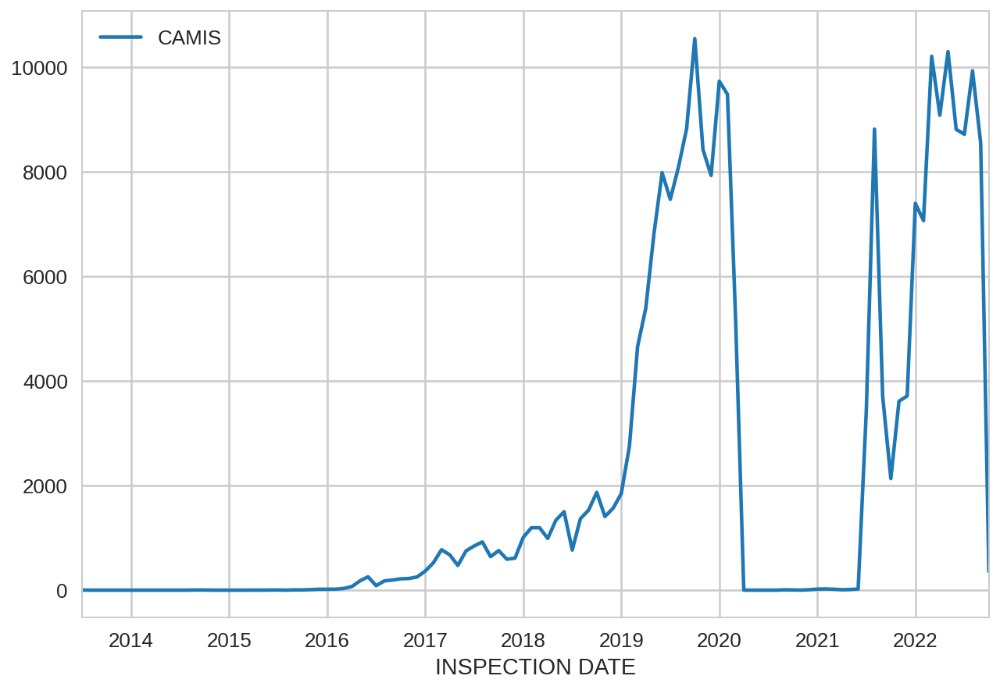

In [ ]:
# Plot the total number of inspections, over 1-month periods
pivot.resample('1M').sum().plot()

Text(0.5, 1.0, 'Analysis of Number of Inspections over Time')

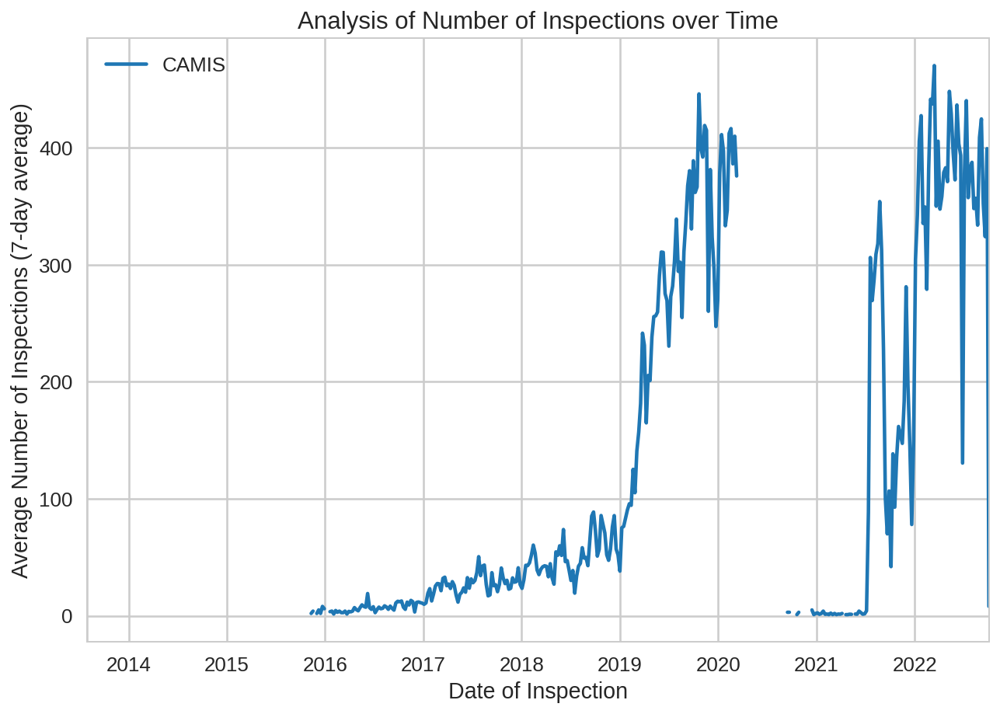

In [ ]:
plot = pivot.resample('7D').mean().plot()
plot.set_xlabel("Date of Inspection")
plot.set_ylabel("Average Number of Inspections (7-day average)")
plot.set_title("Analysis of Number of Inspections over Time")

#### 2.9.3 Pivot Table with two (or more) variables)

We would like to break down the results by **borough**, so we add the `column` parameter.

In [ ]:
pivot2 = pd.pivot_table(
    data = restaurants,
    index = 'INSPECTION DATE', 
    columns = 'BORO', 
    values = 'CAMIS', 
    aggfunc = 'count'
)
pivot2.head(10)

BORO,0,Bronx,Brooklyn,Manhattan,Queens,Staten Island
INSPECTION DATE,,,,,,
1900-01-01,35,321,1050,1652,981,138
2013-07-30,0,0,0,1,0,0
2014-09-23,0,0,0,3,0,0
2014-10-14,0,0,0,2,0,0
2015-04-21,0,0,0,1,0,0
2015-06-25,0,0,0,0,2,0
2015-07-08,0,0,0,0,3,0
2015-09-24,0,0,4,1,0,0
2015-10-14,0,0,0,2,0,0


###### Deleting rows and columns

Now, you will notice that there are a few columns and rows that are just noise. The first row with date *'1900-01-01'* is clearly noise. We can use the `drop` command of Pandas to drop these.

In [ ]:
# The axis='index' (or axis=0) means that we delete a row with that index value
pivot2 = pivot2.drop(pd.to_datetime('1900-01-01'), axis='index') 

In [ ]:
pivot2.tail(5)

BORO,0,Bronx,Brooklyn,Manhattan,Queens,Staten Island
INSPECTION DATE,,,,,,
2022-09-28,0,51,125,183,92,0
2022-09-29,0,25,137,129,159,13
2022-09-30,0,33,95,84,61,20
2022-10-03,0,36,103,86,86,39
2022-10-04,0,0,0,8,0,0


In [ ]:
# We resample the index, to keep only dates every one month
# For that one month period, we compute the average value
pivot2.resample('1M').mean().tail(10)

BORO,0,Bronx,Brooklyn,Manhattan,Queens,Staten Island
INSPECTION DATE,,,,,,
2022-01-31,0.00,32.450000,112.900000,123.750000,82.300000,18.200000
2022-02-28,0.00,32.000000,89.333333,123.000000,77.333333,14.619048
2022-03-31,0.00,34.666667,111.375000,174.416667,93.333333,11.375000
2022-04-30,0.08,34.760000,96.720000,142.560000,80.680000,8.280000
2022-05-31,0.12,34.520000,134.080000,142.400000,90.160000,10.480000
2022-06-30,0.00,37.043478,100.782609,159.782609,76.304348,9.000000
2022-07-31,0.00,31.130435,87.869565,161.304348,86.652174,11.869565
2022-08-31,0.00,41.111111,81.370370,149.185185,82.777778,13.185185
2022-09-30,0.00,36.478261,92.782609,137.739130,90.869565,13.565217


If we plot a dataframe then by default the index column in our case the INSPECTION DATE becomes the x-asis and all the columns become separate lines in the plot.

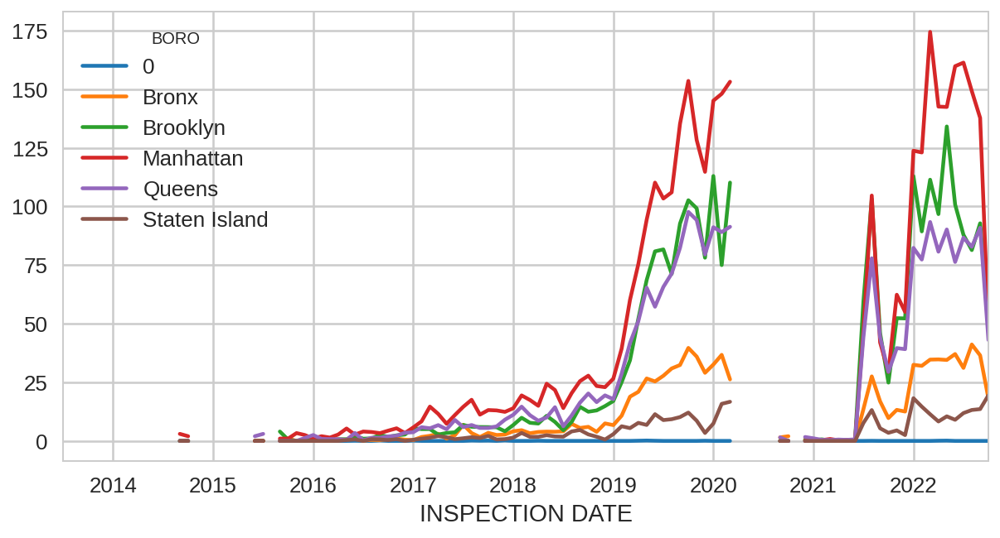

In [ ]:
pivot2.resample('1M').mean().plot(figsize=(10,5))

# Potential Exercise, if we have time: 
# Drop the last date, which corresponds to an incomplete month

### 2.10 (Optional, FYI) Advanced Pivot Tables

We can also add multiple attributes in the index and columns. It is also possible to have multiple aggregation functions, and we can even define our own aggregation functions.

In [ ]:
# We write a function that returns the 
# number of unique items in a list x 
def count_unique(x):
    return len(set(x))

# We break down by BORO and GRADE, and also calculate 
# inspections in unique (unique restaurants) 
# and non-unique entries (effectuvely, violations)
pivot_advanced = pd.pivot_table(
    data = restaurants,
    index = 'GRADE DATE', 
    columns = ['BORO', 'GRADE'],
    values = 'CAMIS', 
    aggfunc = ['count', count_unique]
)

# Take the total number of inspections (unique and non-unique)
agg = pivot_advanced.resample('1M').sum()

# Show the last 5 entries and show the transpose (.T) 
agg.tail().T

GRADE DATE                        2022-06-30  2022-07-31  2022-08-31  \
             BORO          GRADE                                       
count        0             A             0.0         0.0         0.0   
                           B             0.0         0.0         0.0   
                           C             0.0         0.0         0.0   
             Bronx         A           223.0       133.0       259.0   
                           B            20.0         8.0        19.0   
                           C            21.0         7.0         0.0   
             Brooklyn      A           594.0       433.0       527.0   
                           B            41.0         4.0        68.0   
                           C            71.0        45.0         6.0   
             Manhattan     A           964.0       844.0      1005.0   
                           B            94.0        40.0        48.0   
                           C            53.0        39.0         0.0   
             Queens        A           488.0       460.0       568.0   
                           B            30.0         5.0        22.0   
                           C            28.0        28.0        27.0   
             Staten Island A           106.0        81.0       144.0   
                           B             0.0         7.0        13.0   
                           C             0.0         6.0        12.0   
count_unique 0             A             0.0         0.0         0.0   
             Bronx         A            79.0        59.0       105.0   
                           B             5.0         2.0         4.0   
                           C             3.0         1.0         0.0   
             Brooklyn      A           255.0       210.0       236.0   
                           B            10.0         1.0        14.0   
                           C            11.0         6.0         1.0   
             Manhattan     A           404.0       373.0       429.0   
                           B            19.0         9.0        13.0   
                           C            10.0         6.0         0.0   
             Queens        A           198.0       198.0       244.0   
                           B             6.0         1.0         5.0   
                           C             5.0         5.0         4.0   
             Staten Island A            39.0        32.0        56.0   
                           B             0.0         2.0         3.0   
                           C             0.0         1.0         1.0   

GRADE DATE                        2022-09-30  2022-10-31  
             BORO          GRADE                          
count        0             A             0.0         0.0  
                           B             0.0         0.0  
                           C             0.0         0.0  
             Bronx         A           139.0        18.0  
                           B             0.0         0.0  
                           C             7.0         0.0  
             Brooklyn      A           566.0        17.0  
                           B             7.0         0.0  
                           C            18.0         0.0  
             Manhattan     A           850.0        19.0  
                           B            19.0         0.0  
                           C             4.0         0.0  
             Queens        A           484.0        15.0  
                           B            10.0         0.0  
                           C             0.0         0.0  
             Staten Island A           132.0         8.0  
                           B             0.0         0.0  
                           C             0.0         0.0  
count_unique 0             A             0.0         0.0  
             Bronx         A            61.0         6.0  
                           B             0.0         0.0  
                           C             1.0      

### 2.11 Exercises

#### Exercise 1 

Now let's do the same exercise, but instead of counting the number of inspections, we want to compute the average score assigned by the inspectors. Hint: We will need to change the `values` and the `aggfunc` parameters in the `pivot_table` function above.

In [ ]:
pivot = pd.pivot_table(
    data = restaurants, 
    index = 'INSPECTION DATE', # specifies the rows
    values = 'SCORE',  # specifies the content of the cells
    aggfunc = 'mean' # compute the average SCORE
)

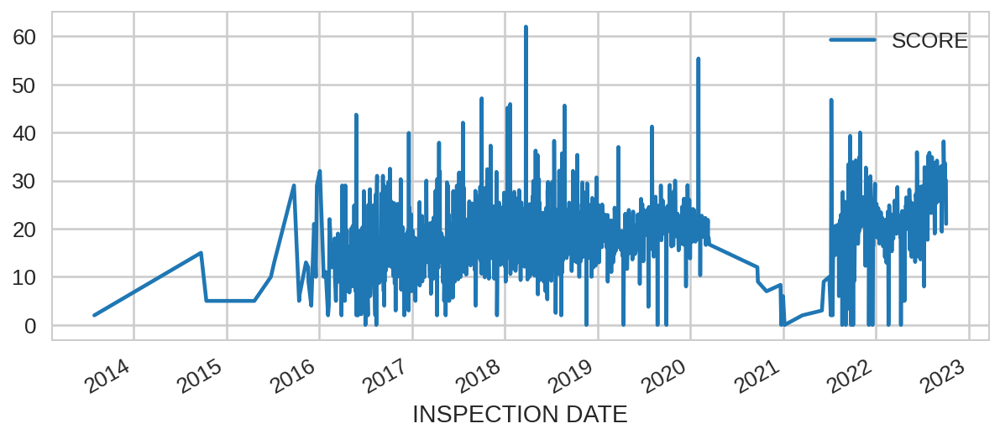

In [ ]:
pivot.plot(figsize=(10,4))

In [ ]:
pivot.resample('1M').mean().tail(10)

,SCORE
INSPECTION DATE,
2022-01-31,20.538643
2022-02-28,18.963619
2022-03-31,20.964162
2022-04-30,19.388408
2022-05-31,22.708112
2022-06-30,24.495405
2022-07-31,27.417149
2022-08-31,29.382119
2022-09-30,29.388668


#### Exercise 2

We now want to examine if different cuisines have different inspection scores. Compute the average inspection score by cuisine. Use the `sort_values()` command ([documentation](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.sort_values.html)) to order cuisines by their inspection scores.

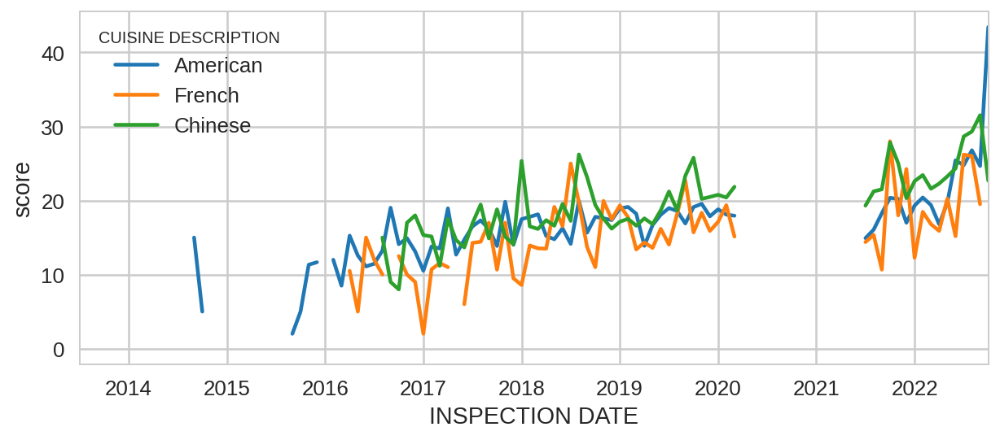

In [ ]:
pivot = pd.pivot_table(
    data = restaurants, 
    index = 'INSPECTION DATE', # dates are the rows
    columns = 'CUISINE DESCRIPTION', # cuisines are the columns
    values = 'SCORE',  # we analyze the SCORE
    aggfunc = 'mean' # compute the average SCORE
)
# Select 3 columns (american, frenchn, chinese), compute the average score for a month
# and plot the results
pivot[ ["American", "French", "Chinese"] ].resample('1M').mean().plot(figsize=(10,4))
plt.ylabel("score");

## 3. NYPD Vehicle Collisions

So farm we interacted with the NYC Restaurant Inspection Data. Now, let's download another dataset, and do some analysis. We will focus on the [NYPD Vehicle Collisions](https://data.cityofnewyork.us/Public-Safety/NYPD-Motor-Vehicle-Collisions/h9gi-nx95/data) data set.


### 3.1 Introduction to the dataset
Load the accidents dataset from url 


In [ ]:
df = pd.read_csv('https://data.cityofnewyork.us/api/views/h9gi-nx95/rows.csv?accessType=DOWNLOAD', low_memory=False)

In [ ]:
df.head()

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,09/11/2021,2:39,NaN,NaN,NaN,NaN,NaN,WHITESTONE EXPRESSWAY,20 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4455765,Sedan,Sedan,NaN,NaN,NaN
1,03/26/2022,11:45,NaN,NaN,NaN,NaN,NaN,QUEENSBORO BRIDGE UPPER,NaN,NaN,...,NaN,NaN,NaN,NaN,4513547,Sedan,NaN,NaN,NaN,NaN
2,06/29/2022,6:55,NaN,NaN,NaN,NaN,NaN,THROGS NECK BRIDGE,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4541903,Sedan,Pick-up Truck,NaN,NaN,NaN
3,09/11/2021,9:35,BROOKLYN,11208,40.667202,-73.866500,"(40.667202, -73.8665)",NaN,NaN,1211 LORING AVENUE,...,NaN,NaN,NaN,NaN,4456314,Sedan,NaN,NaN,NaN,NaN
4,12/14/2021,8:13,BROOKLYN,11233,40.683304,-73.917274,"(40.683304, -73.917274)",SARATOGA AVENUE,DECATUR STREET,NaN,...,NaN,NaN,NaN,NaN,4486609,NaN,NaN,NaN,NaN,NaN


Or we can first download it and then load it with pandas

In [ ]:
# !curl 'https://data.cityofnewyork.us/api/views/h9gi-nx95/rows.csv?accessType=DOWNLOAD' -o data/accidents.csv

In [ ]:
# df = pd.read_csv("data/accidents.csv", low_memory=False)

In [ ]:
len(df)

1933377

### 3.2 Plots, graphs and pivot tables

Find out the most common contributing factors to the collisions. 
 

In [ ]:
df['CONTRIBUTING FACTOR VEHICLE 1'].value_counts().head(11)

Unspecified                       672747
Driver Inattention/Distraction    379992
Failure to Yield Right-of-Way     113275
Following Too Closely             102039
Backing Unsafely                   72447
Other Vehicular                    60153
Passing or Lane Usage Improper     51636
Turning Improperly                 47925
Fatigued/Drowsy                    47257
Passing Too Closely                46847
Unsafe Lane Changing               37973
Name: CONTRIBUTING FACTOR VEHICLE 1, dtype: int64

Now let's plot a histogram of the above list. Note that we skip the first element.

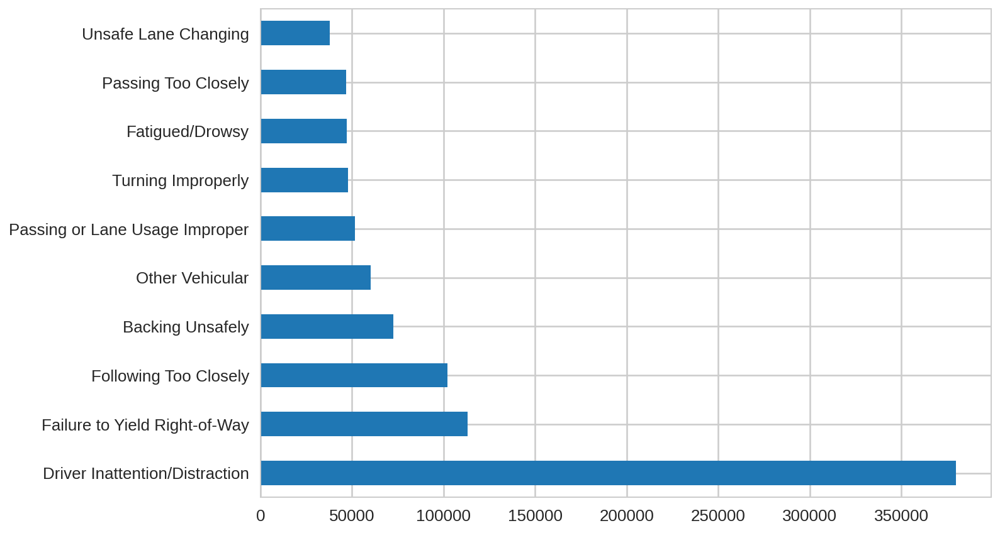

In [ ]:
df['CONTRIBUTING FACTOR VEHICLE 1'].value_counts()[1:11].plot(kind='barh')

Break down the number of collisions by borough.

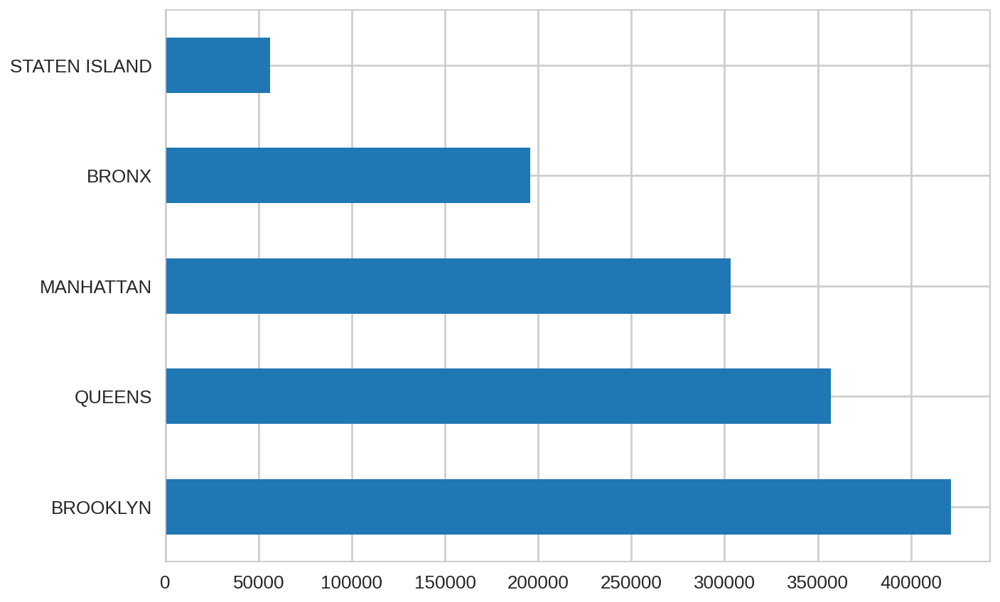

In [ ]:
df.BOROUGH.value_counts().plot(kind='barh')

Find out how many collisions had 0 person injured, 1 person injured, etc. persons injured in each accident. Use the `value_counts()` approach. You may also find the `.plot(logy=True)` option useful when you create the plot to make the y-axis logarigthmic.
 

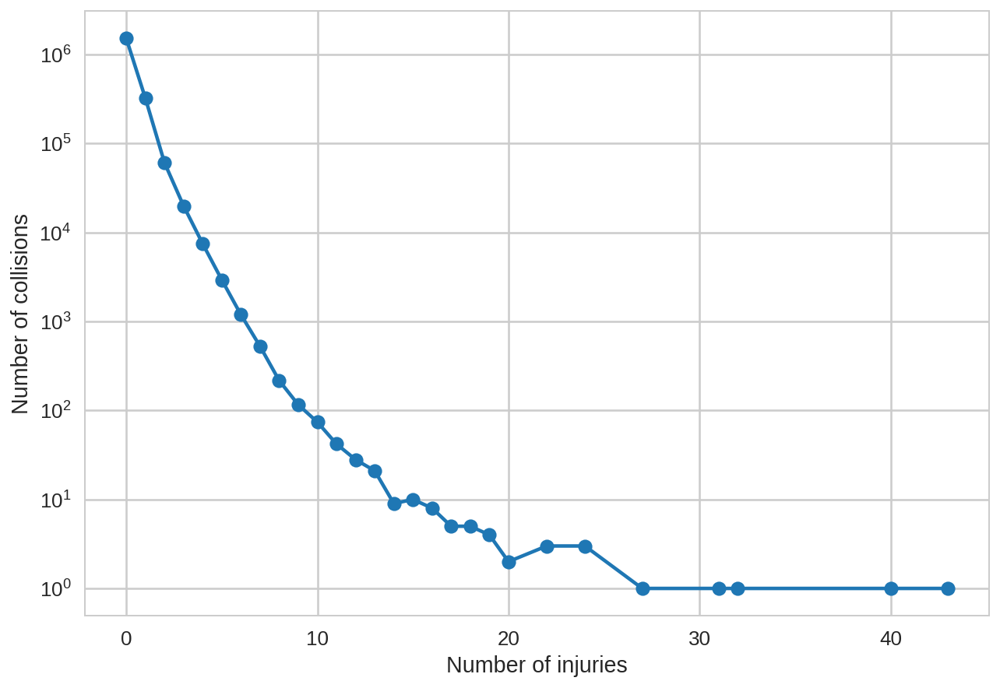

In [ ]:
plot = (
    df['NUMBER OF PERSONS INJURED'] # take the num of injuries column
    .value_counts() # compure the freuquency of each value
    .sort_index() # sort the results based on the index value instead of the frequency, 
                  # which is the default for value_counts
    .plot( # and plot the results
        kind='line', # we use a line plot because the x-axis is numeric/continuous
        marker='o',  # we use a marker to mark where we have data points 
        logy=True # make the y-axis logarithmic
    )
)
plot.set_xlabel("Number of injuries")
plot.set_ylabel("Number of collisions");

Break down the accidents by borough and contributing factor. Use the `pivot_table` function of Pandas
 

In [ ]:
pivot = pd.pivot_table(
    data = df,
    index = 'CONTRIBUTING FACTOR VEHICLE 1',
    columns = 'BOROUGH',
    aggfunc = 'count',
    values = 'COLLISION_ID'
)
pivot.head(10)

BOROUGH,BRONX,BROOKLYN,MANHATTAN,QUEENS,STATEN ISLAND
CONTRIBUTING FACTOR VEHICLE 1,,,,,
1,NaN,3.0,1.0,2.0,2.0
80,12.0,19.0,9.0,29.0,1.0
Accelerator Defective,125.0,230.0,114.0,206.0,45.0
Aggressive Driving/Road Rage,1164.0,1792.0,1271.0,1267.0,206.0
Alcohol Involvement,2357.0,4361.0,2112.0,4363.0,777.0
Animals Action,124.0,210.0,80.0,268.0,215.0
Backing Unsafely,8436.0,17042.0,11100.0,17803.0,2442.0
Brakes Defective,741.0,1345.0,679.0,1061.0,284.0
Cell Phone (hand-Held),71.0,89.0,50.0,63.0,15.0


Find the dates with the most accidents. Can you figure out what happened on these days? 


In [ ]:
df["CRASH DATE"].value_counts().head(10)

01/21/2014    1161
11/15/2018    1065
12/15/2017     999
05/19/2017     974
01/18/2015     961
02/03/2014     960
03/06/2015     939
05/18/2017     911
01/07/2017     896
03/02/2018     884
Name: CRASH DATE, dtype: int64

Plot the number of accidents per day. (Hint: Ensure that your date column is in the right datatype and that it is properly sorted, before plotting)


In [ ]:
df["CRASH DATE"] = pd.to_datetime(df["CRASH DATE"], format="%m/%d/%Y")

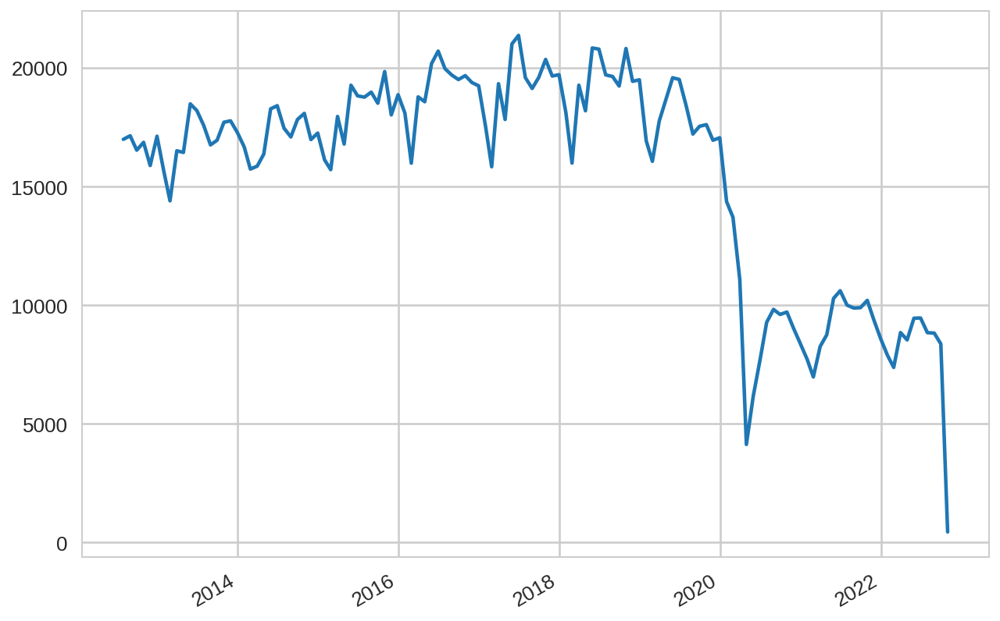

In [ ]:
(
    df["CRASH DATE"].value_counts() # count the number of accidents per day
    .sort_index() # sort the dates
    .resample('1M') # take periods of 1 month
    .sum() # sum the number of accidents per month
    .drop(pd.to_datetime('2019-04-30'), axis='index') # drop the current month
    .plot() # plot the result
);

Plot the accidents in map. Use a scatter plot using the `plot(kind='scatter', x=..., y=....)` command, and use the `LATITUDE` and `LONGITUDE` parameters. (Hint: **You will have to remove bad data points before getting into the right visual result**. To do this, specify a selection condition to limit the lat/long values to be values that are proper for the NYC region.)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


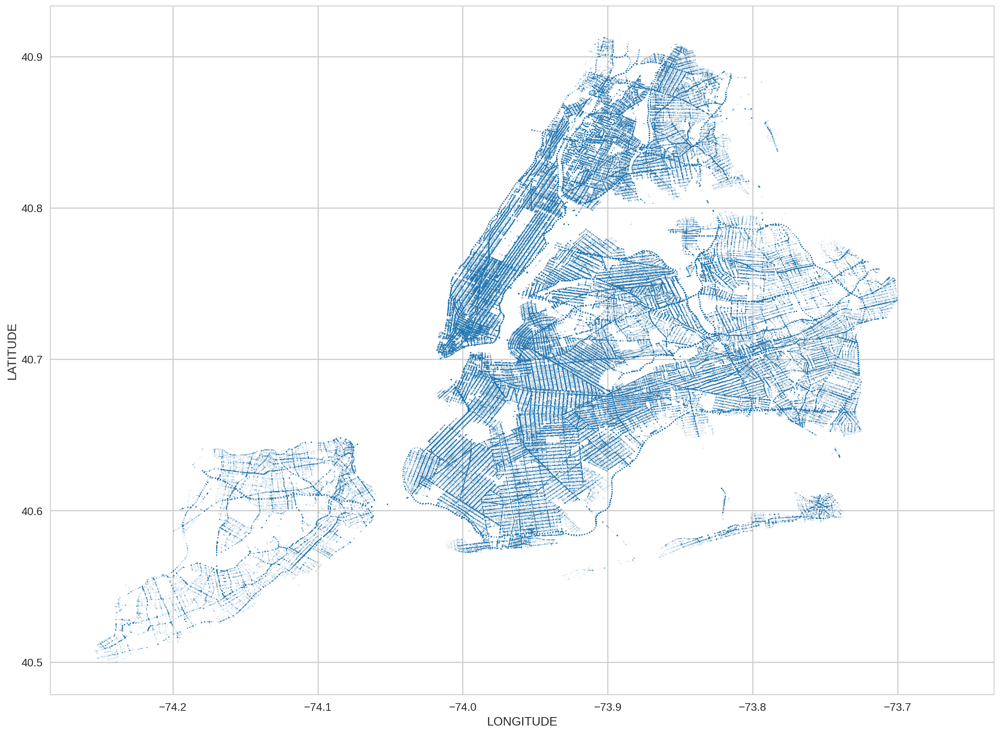

In [ ]:
cleandf = df[(df.LONGITUDE<-50) & (df.LONGITUDE>-74.5) & (df.LATITUDE< 41)]

cleandf[ (df.LATITUDE>40) & (df.LATITUDE<41) & (df.LONGITUDE> -74.6) & (df.LONGITUDE<-50) ].plot(
    figsize = (20,15),
    kind = 'scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    s = 1, # make each dot to be very small 
    alpha = 0.05 # makes each point 95% transparent
)


Plot the accidents in map as above, but limit the data only to accidents with at least one injury.

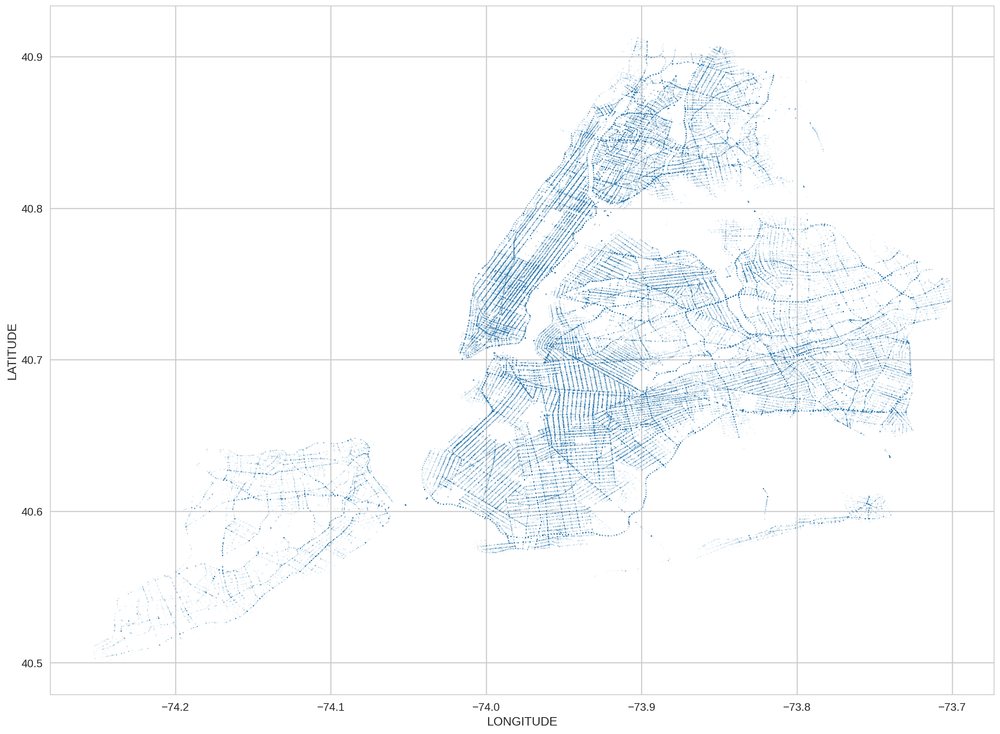

In [ ]:
mask_injured = cleandf['NUMBER OF PERSONS INJURED']>=1
injured_df = cleandf[mask_injured]

injured_df.plot(
    kind = 'scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    s = 1, # make the size of the marker 1 pixel
    figsize = (20,15), # increase the size of the figure
    alpha = 0.05 # make each dot to be 95% transparent 
)

### 3.3 2d histograms, density plots, and contour plots
In the picture above, we can visually see that Manhattan, especially eastern midtown, and the area downtown near the entrance to the bridges, has a higher density. We can also derive histograms and density plots on 2-dimensions.

#### 3.3.1 Hexagonal bin plot
The hexbin plot created a 2-d histogram, where the color signals the number of points within a particular area. The `gridsize` parameter indicates the number of hexagones in the x direction. Higher values offer higher granularity, but very high values tend to create sparsity, when we do not have enough data points.

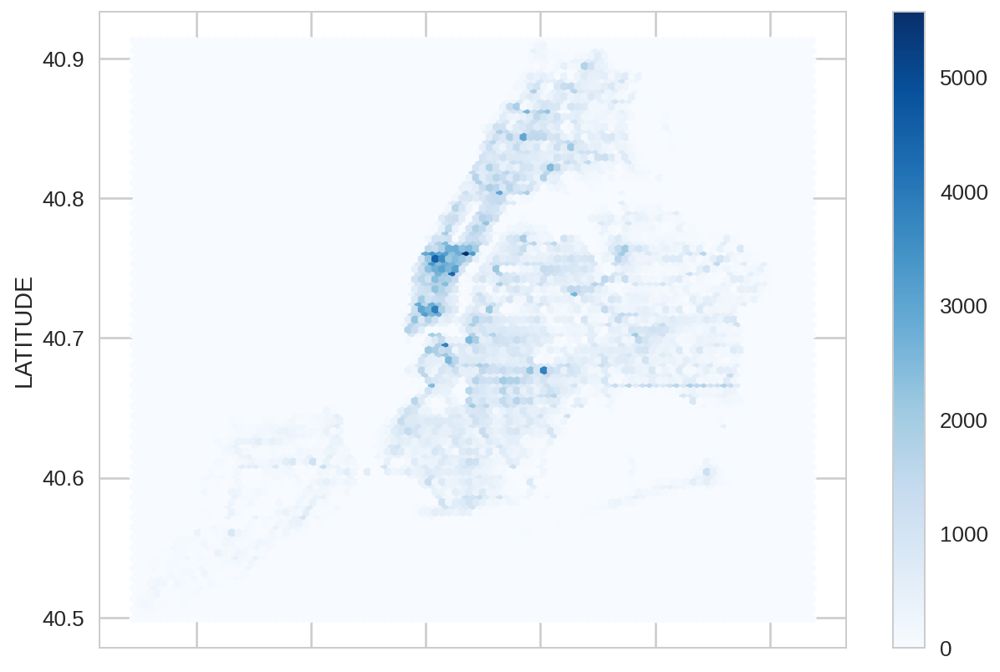

In [ ]:
# Hexbin plot
cleandf.plot(
    kind='hexbin',
    x='LONGITUDE',
    y='LATITUDE',
    gridsize=100,
    cmap=plt.cm.Blues,
    figsize=(10, 7))

#### 3.3.2 2d density  and contour plots
An alternative to the hexbin plots is to use density plots in two dimensions.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1718: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


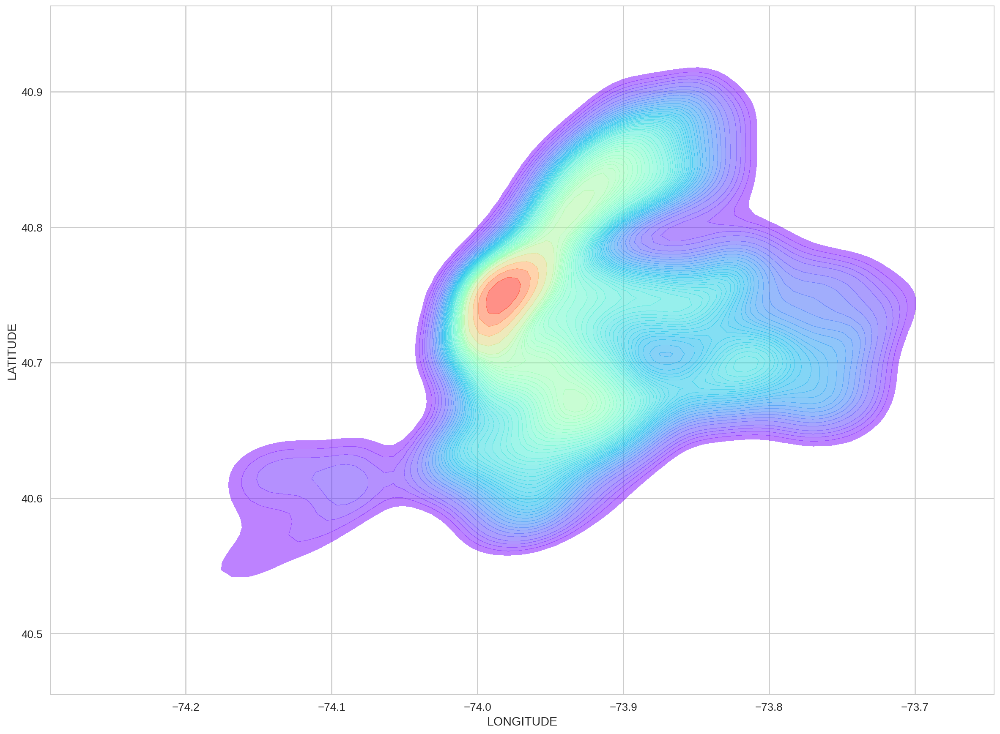

In [ ]:
# Basic 2D density plot
plt.subplots(figsize=(20, 15))

# We take a sample, because density plots take a long time to compute
# and a sample is typically as good as the full dataset
sample = cleandf.sample(10000)

sns.kdeplot(
    sample.LONGITUDE,
    sample.LATITUDE,
    gridsize=100,  # controls the resolution
    cmap=plt.cm.rainbow,  # color scheme
    shade= True, # whether to have a density plot (True), or just the contours (False)
    alpha=0.5,
    shade_lowest=False,
    n_levels=50  # How many contours/levels to have
)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1718: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


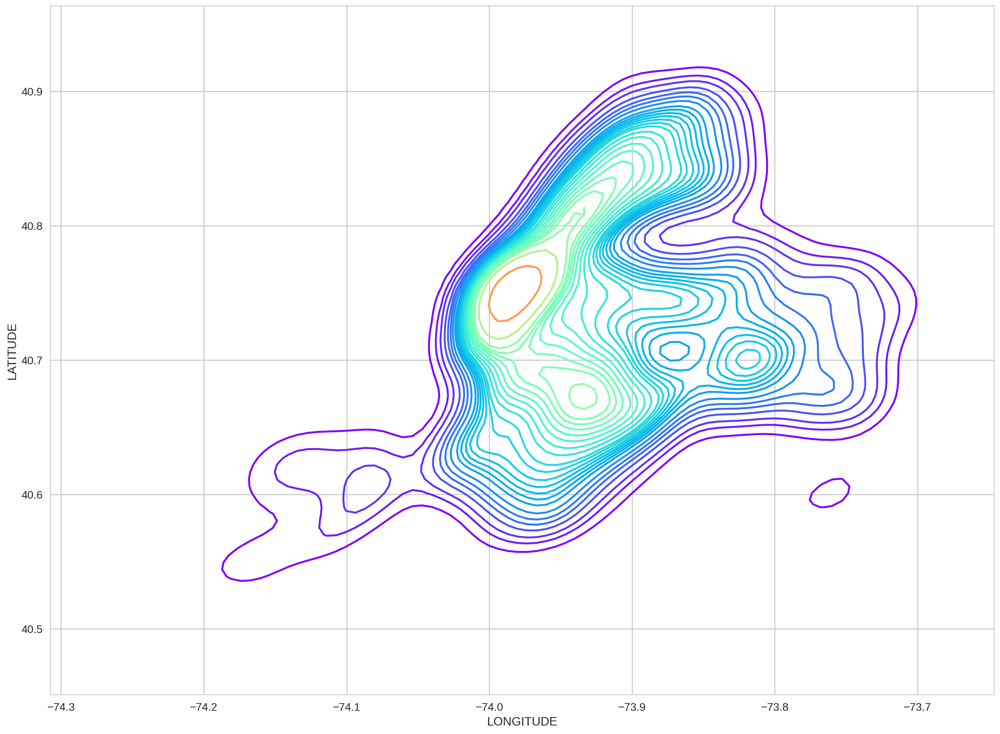

In [ ]:
# Basic 2D contour plot
plt.subplots(figsize=(20, 15))

# We take a sample, because density plots take a long time to compute
# and a sample is typically as good as the full dataset
sample = cleandf.sample(10000)

sns.kdeplot(
    sample.LONGITUDE,
    sample.LATITUDE,
    gridsize=100,
    cmap=plt.cm.rainbow,
    shade=False,
    shade_lowest=False,
    n_levels=25)

### 3.4 Combining plots
So far, we examined how to create individual plots. We can even combine multiple plots together, using the ax parameter. So, let's say that we want to combine the scatter plots with the contour plot above:

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1718: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


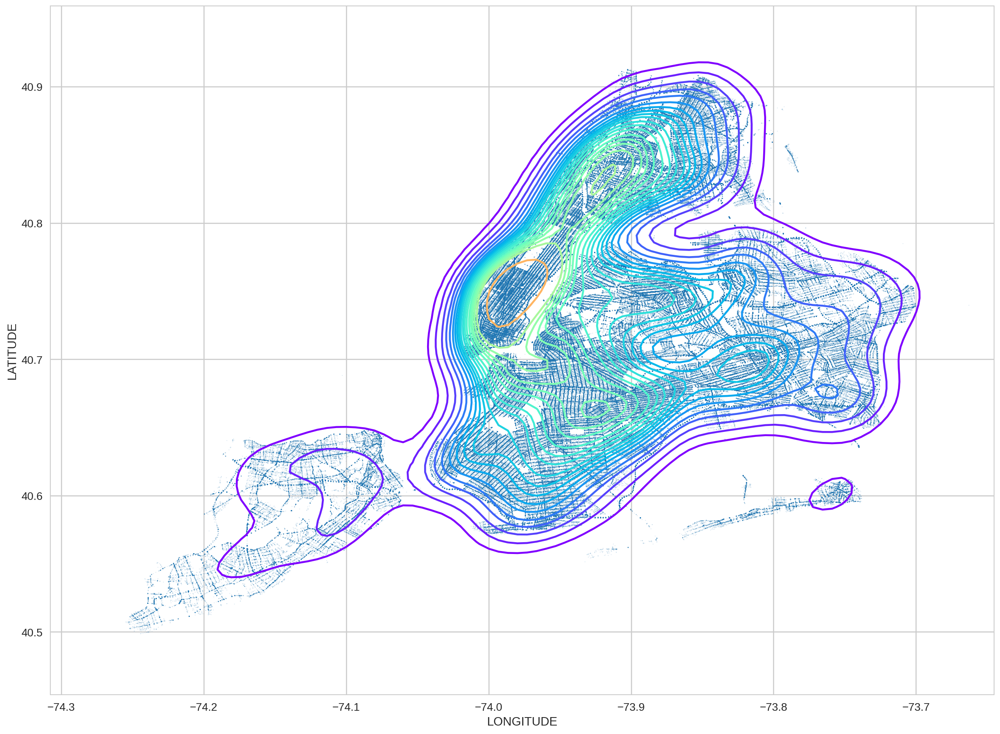

In [ ]:
sample = cleandf.sample(10000)

scatterplot = cleandf.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(20, 15),
    s=0.5,
    alpha=0.1)

sns.kdeplot(
    sample.LONGITUDE,
    sample.LATITUDE,
    gridsize=100,
    cmap=plt.cm.rainbow,
    shade=False,
    shade_lowest=False,
    n_levels=20,
    alpha=1,
    ax=scatterplot)

### 3.5 Bonus plots

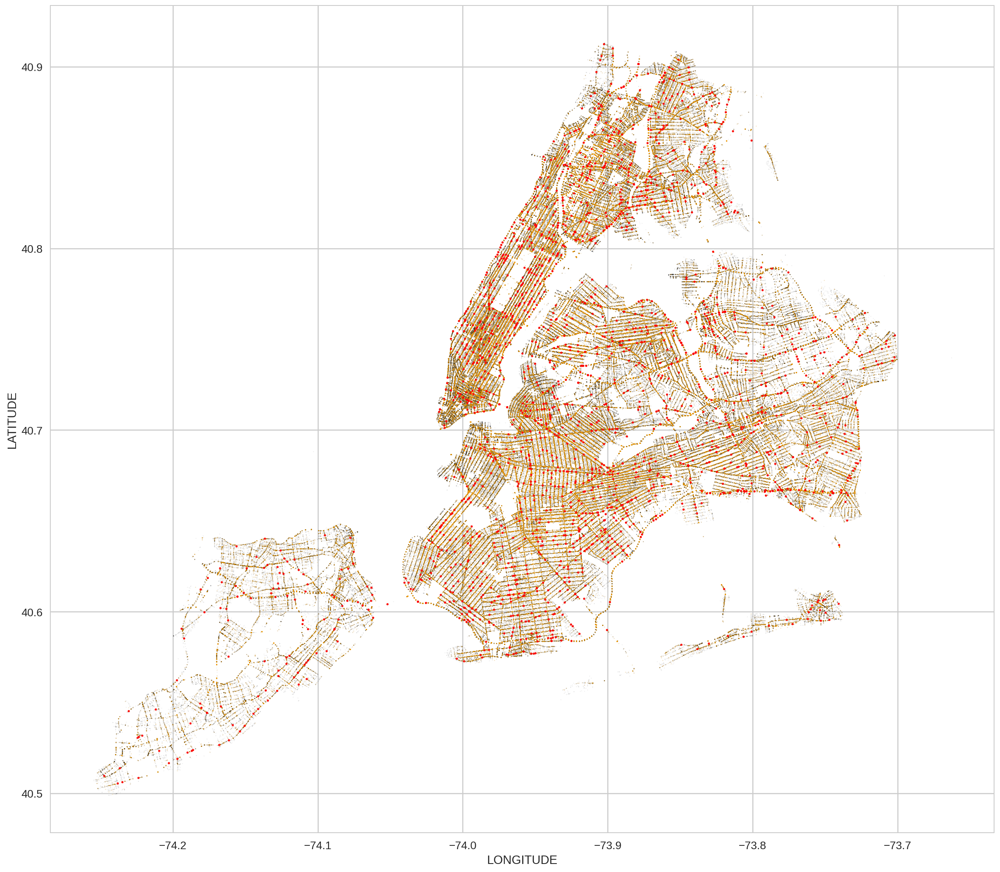

In [ ]:
# In the code below, we create three plots
# One with all the accidents (in black)
# One with all accidents that resulted in an injury (with orange)
# One with all the accidents with deaths (with red dots) 
# Then wen combine the  plots using the "ax" parameter

# We put conditions to keep only rows that 
# have reasonable values for LONGITUDE and LATITUDE
# The & character is the "AND" in Pandas
# the df.LATITUDE is equivalent to df['LATITUDE']
cleandf = df[ (df.LATITUDE > 40) & (df.LATITUDE < 41) & (df.LONGITUDE < -72) & (df.LONGITUDE > -74.5) ]


all_accidents_plot = cleandf.plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    color = 'black',
    alpha = 0.05, # makes the data points transparent (1 = opaque, 0 fully transparent)
    s = 0.5 # make the size of the market just 0.5 pixel
)

# We will keep only entries with at least one injury
# note that we cannot use the df.NUMBER OF PERSON INJURED notation
# because the attribute contains spaces.
mask_injured = cleandf['NUMBER OF PERSONS INJURED']>=1
injured_plot = cleandf[mask_injured].plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    alpha = 0.1, # makes the data points transparent (1 = opaque, 0 fully transparent)
    color = 'orange',
    ax = all_accidents_plot, # the ax parameter allows us to combine plots
    s = 1 # make the size of the market just 1 pixel
)

# we want only accidents with at least one death
mask_killed = cleandf['NUMBER OF PERSONS KILLED']>=1
cleandf[mask_killed].plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    alpha = 0.85, # makes the data points transparent (1 = opaque, 0 fully transparent)
    s = 5, # make the size of the market 5 pixels, to be more visible
    color = 'red',
    ax = injured_plot # the ax parameter allows us to combine plots
)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1718: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0`, but please update your code.
  warnings.warn(msg, UserWarning)


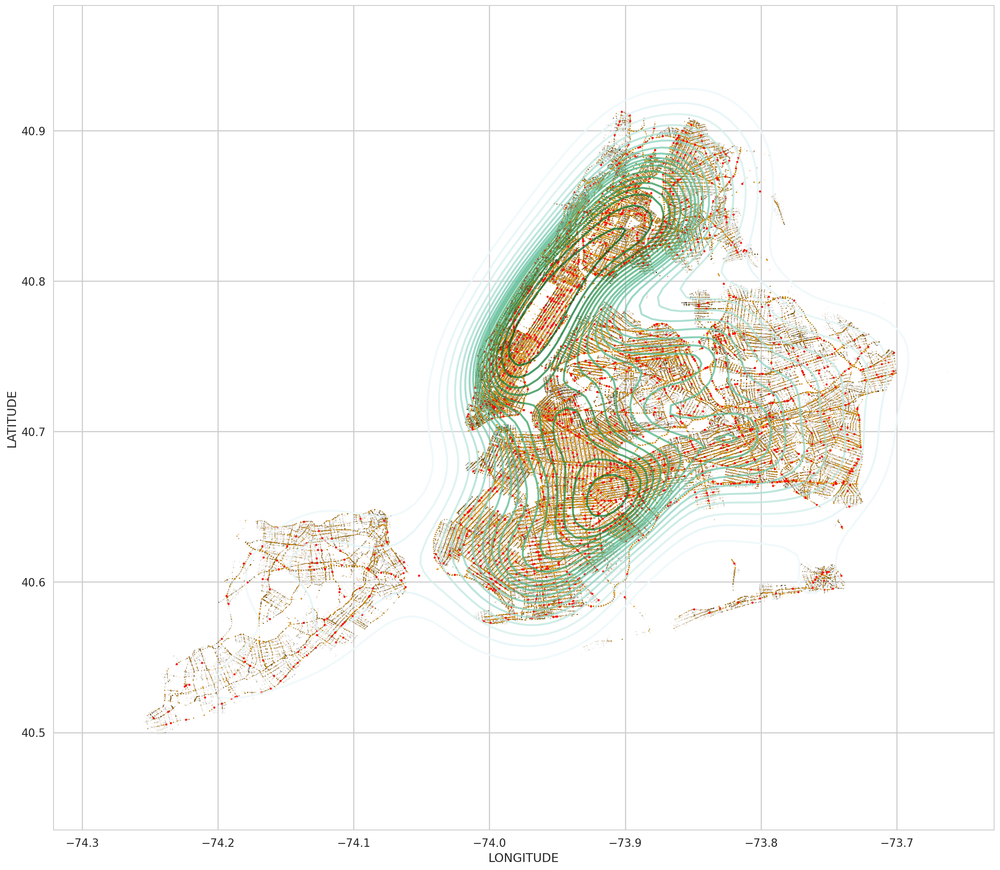

In [ ]:
# Same as above, but with a 2-d density estimation for the location of
# accidents that resulted in at least one death

cleandf = df[ (df.LATITUDE > 40) & (df.LATITUDE < 41) & (df.LONGITUDE < -72) & (df.LONGITUDE > -74.5) ]


all_accidents_plot = cleandf.plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    color = 'black',
    alpha = 0.05, # makes the data points transparent (1 = opaque, 0 fully transparent)
    s = 0.5 # make the size of the market just 0.5 pixel
)

# We will keep only entries with at least one injury
# note that we cannot use the df.NUMBER OF PERSON INJURED notation
# because the attribute contains spaces.
mask_injured = cleandf['NUMBER OF PERSONS INJURED']>=1
injured_plot = cleandf[mask_injured].plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    alpha = 0.1, # makes the data points transparent (1 = opaque, 0 fully transparent)
    color = 'orange',
    ax = all_accidents_plot, # the ax parameter allows us to combine plots
    s = 1 # make the size of the market just 1 pixel
)

# we want only accidents with at least one death
mask_killed = cleandf['NUMBER OF PERSONS KILLED']>=1
killed_plot = cleandf[mask_killed].plot (
    kind='scatter',
    x = 'LONGITUDE',
    y = 'LATITUDE',
    figsize = (20, 18), # changes the size of the plot to be bigger and square
    alpha = 0.85, # makes the data points transparent (1 = opaque, 0 fully transparent)
    s = 5, # make the size of the market 5 pixels, to be more visible
    color = 'red',
    ax = injured_plot # the ax parameter allows us to combine plots
)

sns.set_style("white")
mask = cleandf['NUMBER OF PERSONS KILLED']>=1
sample = cleandf[mask] # .sample(10000)

sns.kdeplot(sample.LONGITUDE, sample.LATITUDE, gridsize=100,
            cmap=plt.cm.BuGn, shade=False, shade_lowest=True, n_levels=20, alpha=0.75, ax = killed_plot)